## Time Series Forecasting

### 1. Read the dataset

Here we have started by importing all the necessary libraries and then loading the dataset using read_csv and storing it into a variable called 'data'

In [530]:
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score,KFold

# import scikitplot as skl
sns.set()

# Load the dataset
data = pd.read_csv('energydata_complete.csv')

### 2. Analyse and visualise the data

**head()** is used to show the first few rows of the dataset.

In [531]:
print("First few rows of the dataset:")
data.head()

First few rows of the dataset:


,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


The code below is used to determine the shape of the DataSet.

In [532]:
data.shape

(19735, 29)

The **data.columns** attribute returns a pandas Index object containing the column labels of the DataFrame data. Each label corresponds to the name of a column in the Dataset. This attribute is useful for accessing, iterating over, or manipulating column names programmatically.

In [533]:
data.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

The **data.info()** method provides a concise summary of the DataFrame data, including information about the index, column data types, non-null values, and memory usage.

In [534]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

To display the data types of each column in our dataset, we have used the **.dtypes** attribute.

In [535]:
data.dtypes

date            object
Appliances       int64
lights           int64
T1             float64
RH_1           float64
T2             float64
RH_2           float64
T3             float64
RH_3           float64
T4             float64
RH_4           float64
T5             float64
RH_5           float64
T6             float64
RH_6           float64
T7             float64
RH_7           float64
T8             float64
RH_8           float64
T9             float64
RH_9           float64
T_out          float64
Press_mm_hg    float64
RH_out         float64
Windspeed      float64
Visibility     float64
Tdewpoint      float64
rv1            float64
rv2            float64
dtype: object

The output displays the data types of all the variables in the dataset, showing that most of the variables are either integers or floats, indicating numerical data types. Only the date column is an object type, likely representing date values. Since there are no categorical variables, we do not need to convert any categorical values to numerical values. This simplifies the data preprocessing process and ensures that the data is ready for numerical analysis and modeling without the need for additional encoding steps.

The code below checks for missing values in the DataFrame data and prints the sum of missing values for each column.

In [536]:
# Check for missing values
print(data.isnull().sum())

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64


The output shows that none of the columns in the dataset have missing values, as indicated by the zero values next to each column name. This means that all the data entries are complete and there are no NaN or null values present in any of the columns. Since there are no missing values, there is no need to perform any data removal, imputation, or other handling methods typically required for missing data. This ensures the integrity and completeness of the data for analysis and modeling.

This code generates summary statistics for the numerical columns in the DataFrame data using the **describe()** method.

In [537]:
# Summary statistics for numerical columns
print(data.describe())

         Appliances        lights            T1          RH_1            T2  \
count  19735.000000  19735.000000  19735.000000  19735.000000  19735.000000   
mean      97.694958      3.801875     21.686571     40.259739     20.341219   
std      102.524891      7.935988      1.606066      3.979299      2.192974   
min       10.000000      0.000000     16.790000     27.023333     16.100000   
25%       50.000000      0.000000     20.760000     37.333333     18.790000   
50%       60.000000      0.000000     21.600000     39.656667     20.000000   
75%      100.000000      0.000000     22.600000     43.066667     21.500000   
max     1080.000000     70.000000     26.260000     63.360000     29.856667   

               RH_2            T3          RH_3            T4          RH_4  \
count  19735.000000  19735.000000  19735.000000  19735.000000  19735.000000   
mean      40.420420     22.267611     39.242500     20.855335     39.026904   
std        4.069813      2.006111      3.254576    

The code below converts the values in the 'date' column of the DataFrame data from their current data type (e.g., string) to pandas' datetime type. This is important because working with dates and times as datetime objects allows us to perform various time-related operations (e.g., resampling, extracting specific components such as year, month, day) and ensures accurate and efficient handling of date and time values. And then sets the 'date' column as the index of the DataFrame data.

In [538]:
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)  # Set date column as the index

The code below checks the frequency of a pandas DataFrame's date/time index. If the frequency is already set, it prints the frequency. If the frequency is not known, it infers the frequency using the asfreq() method and pandas' infer_freq() function, then prints the inferred frequency. Understanding the data's frequency is important for time series analysis and forecasting, as it helps us to determine the periodicity of the data and guides the choice of appropriate modeling techniques.

In [539]:
# Check the frequency of the data
freq = data.index.freq

# If frequency is None, try to infer the frequency using asfreq()
if freq is None:
    inferred_freq = data.asfreq(pd.infer_freq(data.index)).index.freq
    print(f'Inferred frequency of the data: {inferred_freq}')
else:
    print(f'Frequency of the data: {freq}')

Inferred frequency of the data: <10 * Minutes>


The code below prints the time period covered by the data in the DataFrame, showing the earliest and latest date present in the DataFrame's index.

In [540]:
# Get the minimum and maximum date from the index
start_date = data.index.min()
end_date = data.index.max()

# Print the time period of the data
print(f"Data covers the time period from {start_date.strftime('%Y-%m-%d')} to {end_date.strftime('%Y-%m-%d')}")

Data covers the time period from 2016-01-11 to 2016-05-27


This code below visualizes the distribution of each feature in the dataset using histograms. It creates histograms for all columns in the DataFrame data by calling the hist method. The method plots histograms for all columns in a grid layout, with each subplot representing a different feature's distribution. 

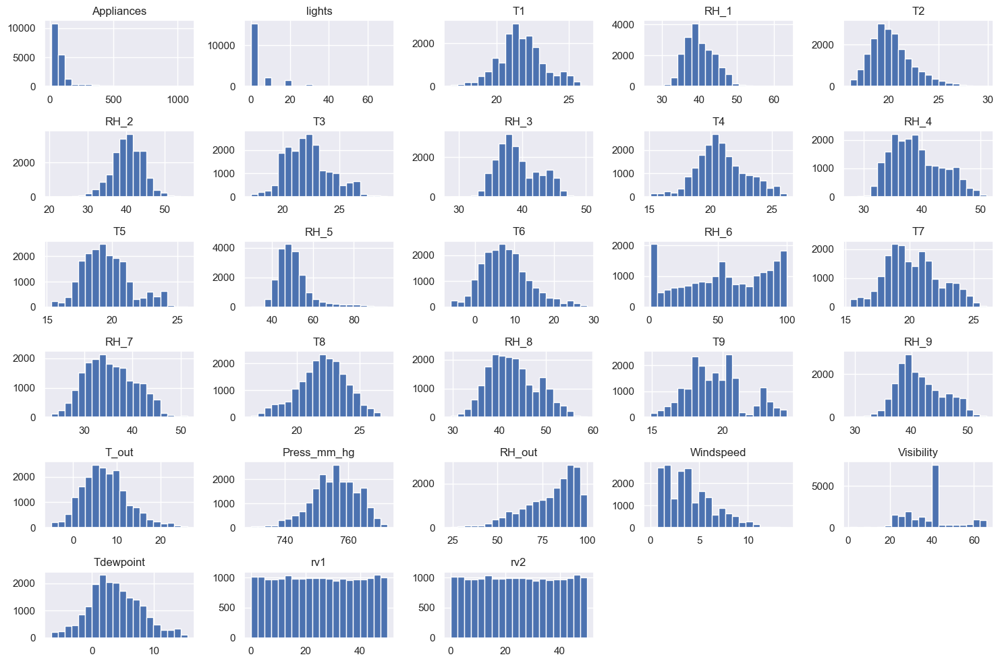

In [541]:
data.hist(figsize=(15, 10), bins=20)
plt.tight_layout()
plt.show()

The code below creates a histogram to visualize the distribution of the target variable, 'Appliances', which represents energy use in the dataset. It uses matplotlib and seaborn libraries to plot the histogram and kernel density estimate (KDE) plot. The plot is set to a size of 10x6 inches using figsize. The sns.histplot function creates the histogram with 30 bins and a KDE curve in blue. The title, x-axis label, and y-axis label are set to describe the plot. This visualization helps in understanding the distribution of the target variable, such as whether it is normally distributed or skewed, and can provide insights into potential modeling strategies.

It shows the distribution or frequency of appliances based on their energy usage levels. From this plot, we can say that the distribution is heavily right-skewed, with the majority of appliances having very low energy usage values concentrated around 0-200 units. There is a sharp peak in the frequency around the 0-100 energy usage range, indicating that most appliances in this dataset consume minimal energy. The distribution suggests that energy-efficient appliances with low energy consumption dominate this particular dataset. There may be a few outliers or high-energy consuming appliances present, as indicated by the small frequencies at the far-right end of the distribution. Overall, this distribution plot highlights the prevalence of low energy consumption appliances in the dataset, with a skewed pattern towards minimal energy usage values.

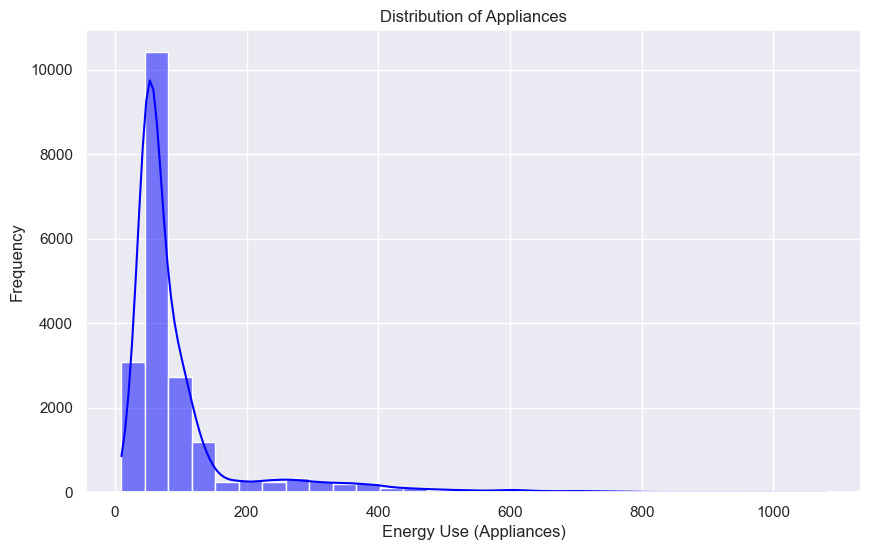

In [542]:
# Plot histogram of the target variable (Appliances)
plt.figure(figsize=(10, 6))
sns.histplot(data['Appliances'], kde=True, bins=30, color='blue')
plt.title('Distribution of Appliances')
plt.xlabel('Energy Use (Appliances)')
plt.ylabel('Frequency')
plt.show()

This code below visualizes the time series of the 'Appliances' variable grouped by month. It creates a new column for month, groups the data by this column, and then plots each month's data with a different color from a predefined color palette. The plot includes labels, a title, and a legend, allowing the user to observe monthly variations in energy usage over time.

This time series plot shows the energy usage or consumption of appliances over time, specifically from January 2016 to June 2016, with data points recorded at the beginning and middle of each month. Here's the brief summary of the key points:

- Shows appliance energy usage from Jan-Jun 2016, with data points at start and mid-month.
- Higher energy consumption in Jan-Feb, likely due to increased heating needs in winter.
- Decreasing trend from Jan-Apr as heating requirements reduced with changing seasons.
- Two distinct usage peaks per month, possibly linked to increased appliance use during those periods.
- Varying peak magnitudes across months, with Jan-Feb having significantly higher peaks due to seasonality.
- Illustrates the influence of seasonal factors and periodic variations on appliance energy consumption patterns over time.

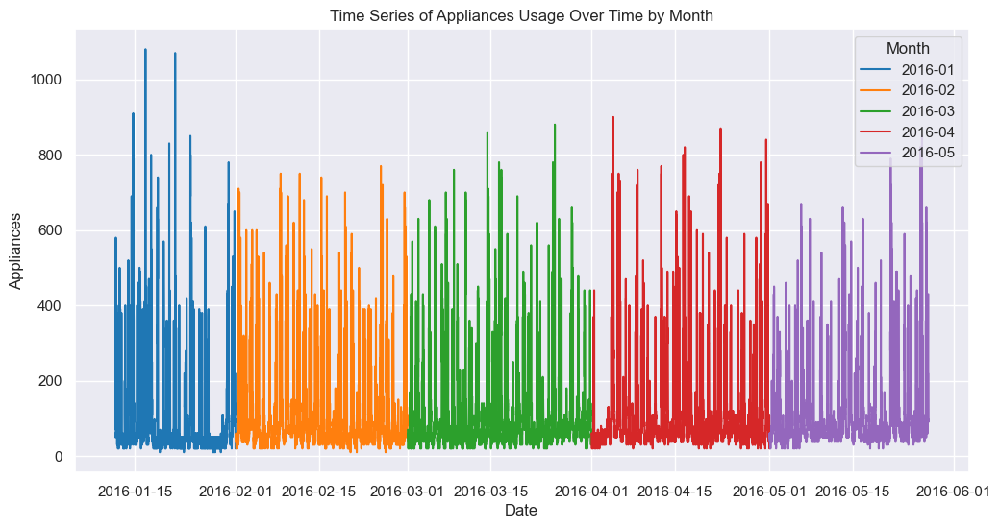

In [620]:
# Create a new column for month
data['Month'] = data.index.strftime('%Y-%m')

# Group the data by month
grouped_data = data.groupby('Month')

# Create a color palette with a color for each month
palette = sns.color_palette('tab10', len(grouped_data))

# Create a figure
plt.figure(figsize=(12, 6))

# Plot each month's data with a different color
for i, (month, group) in enumerate(grouped_data):
    plt.plot(group.index, group['Appliances'], label=month, color=palette[i])

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Appliances')
plt.title('Time Series of Appliances Usage Over Time by Month')

# Add legend
plt.legend(title='Month')

# Show the plot
plt.show()

In [621]:
# Dropping the extra month column added while doing the above time series plot of appliances.

data = data.drop(columns='Month')

This code groups the data by month-end (resamples the data) and calculates the mean of each column for each month. It then iterates through the columns of the resampled monthly data, plotting each column separately. The plots show the monthly mean values for each variable over time, helping to visualize trends and patterns on a monthly basis.

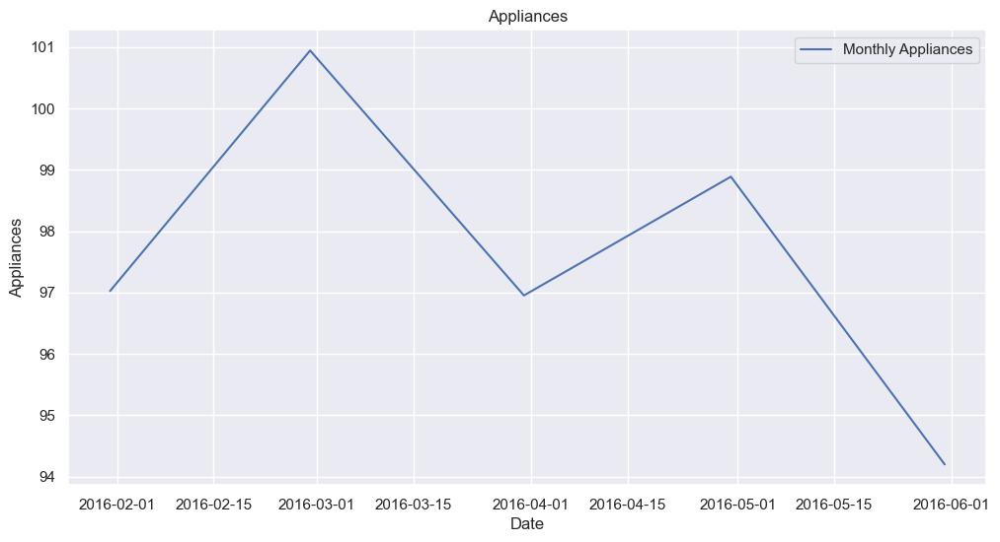

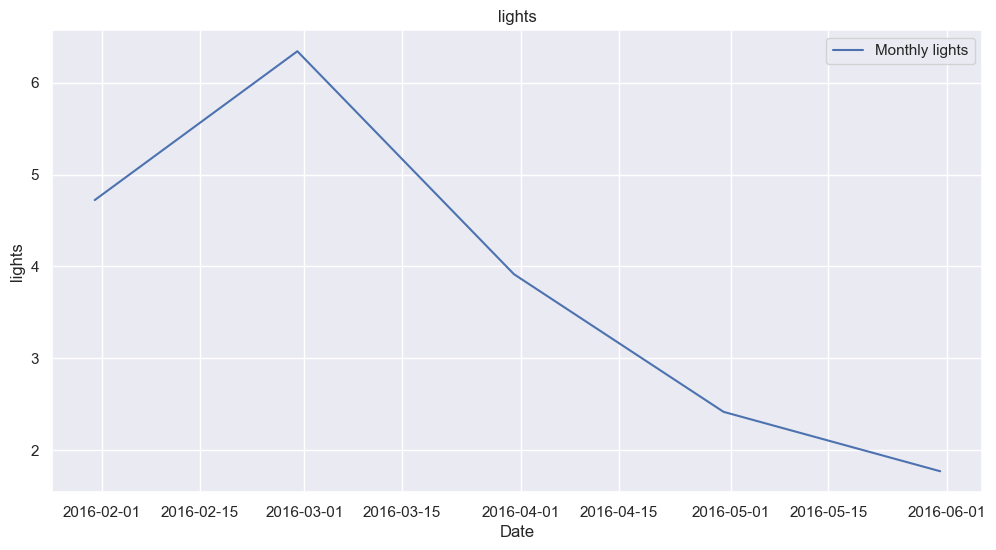

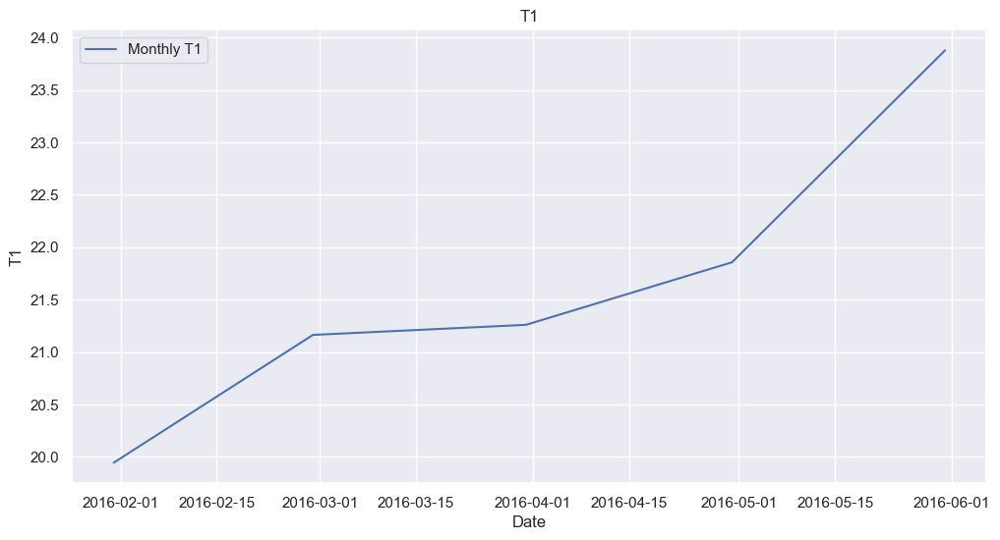

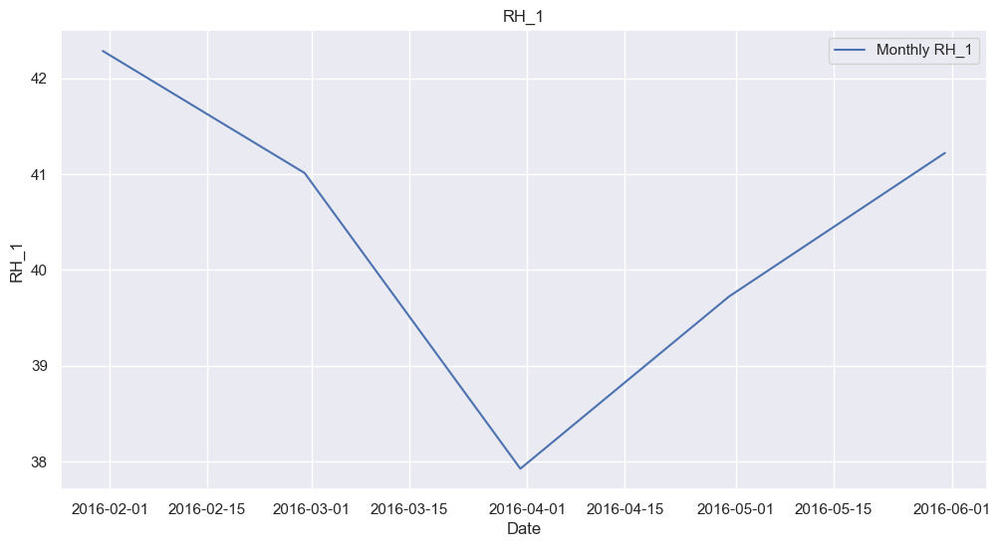

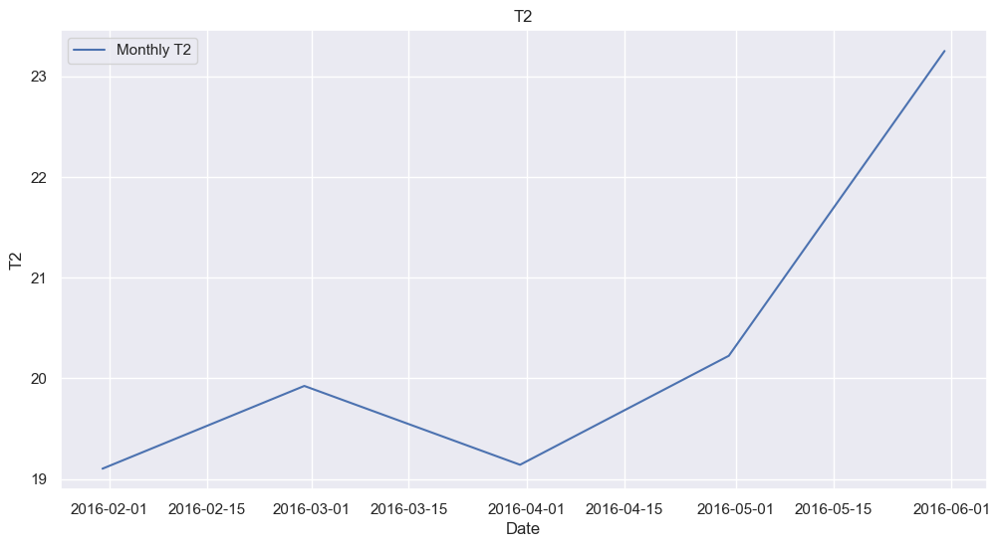

...

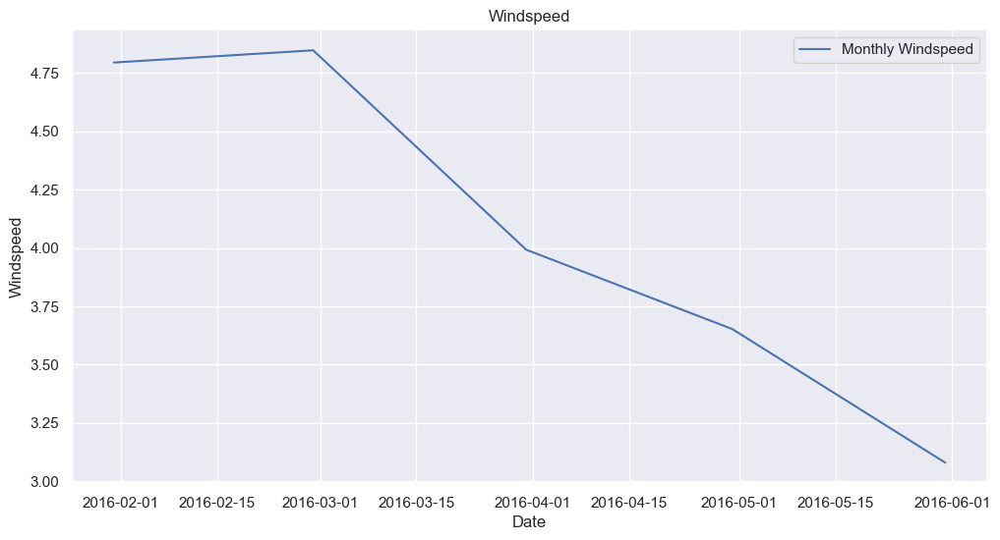

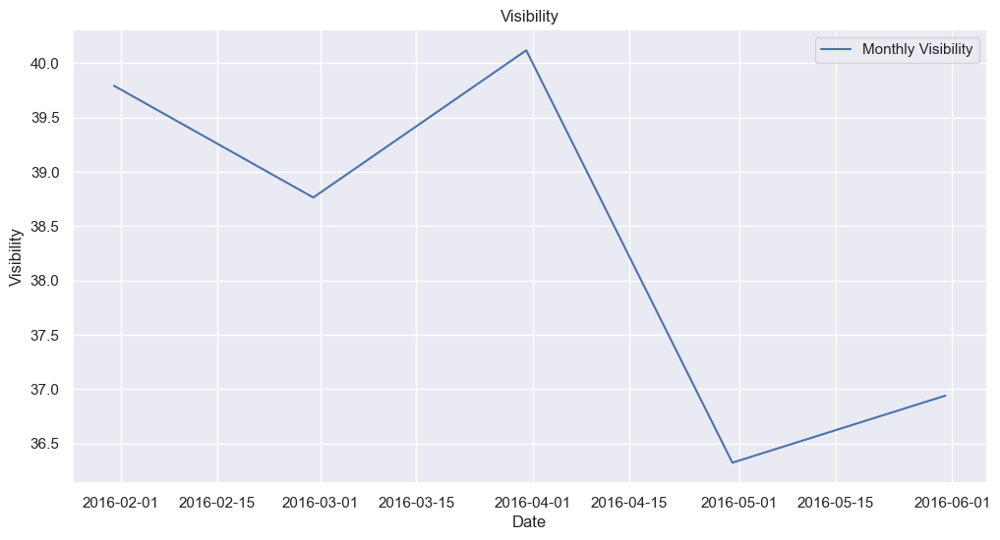

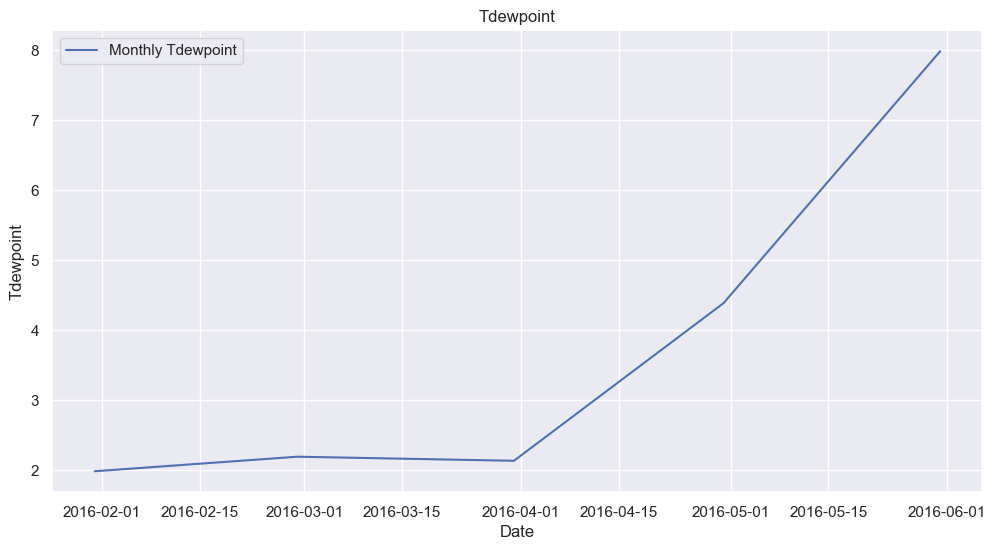

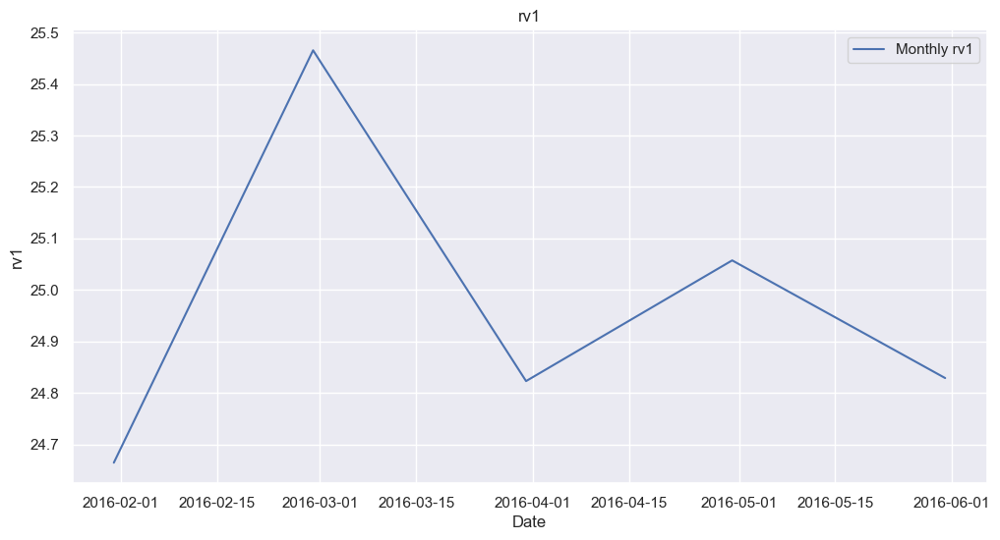

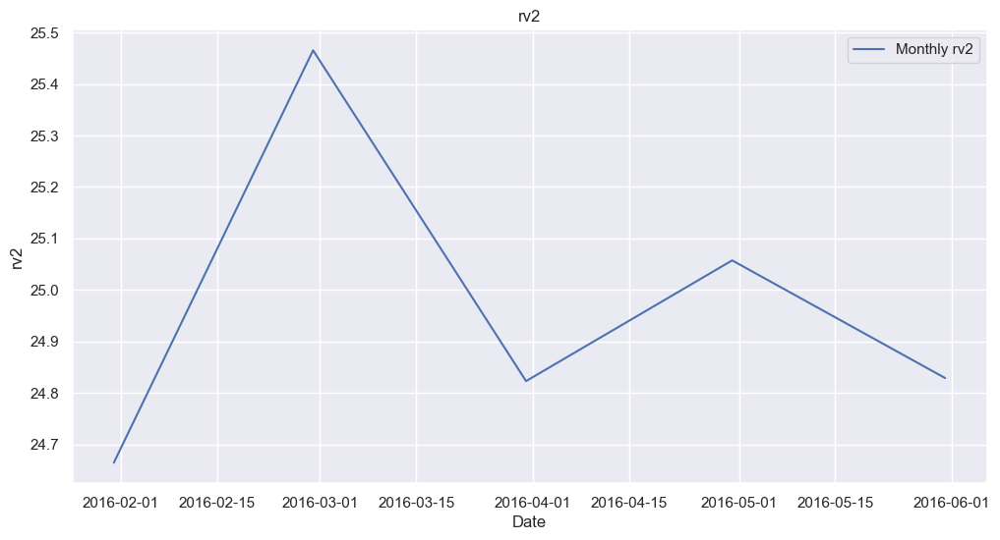

In [545]:
# Group data by month-end and calculate the mean
monthly_data = data.resample('ME').mean()

# Iterate over the columns in the monthly_data DataFrame
for column in monthly_data.columns:
    # Plot the monthly data for each column
    plt.figure(figsize=(12, 6))
    plt.plot(monthly_data.index, monthly_data[column], label=f'Monthly {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.title(column)
    plt.legend()
    plt.show()

This code groups the data by day of the week, calculating the mean energy usage for each day across the entire dataset for each column. For each column in the data, it creates a line plot showing the mean usage for each day of the week, providing a visual representation of how the usage varies on a daily cycle. The x-axis labels are mapped to the names of the days of the week for better readability.

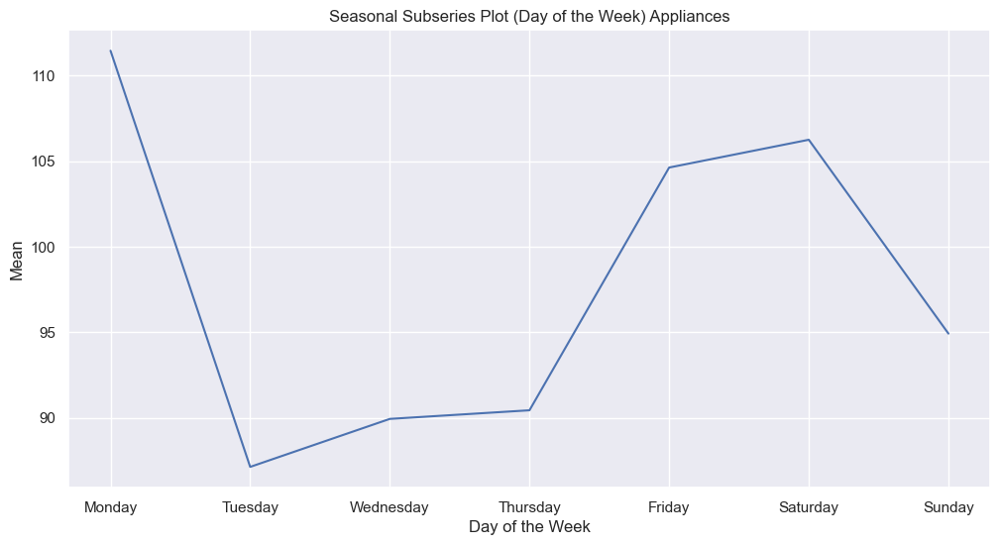

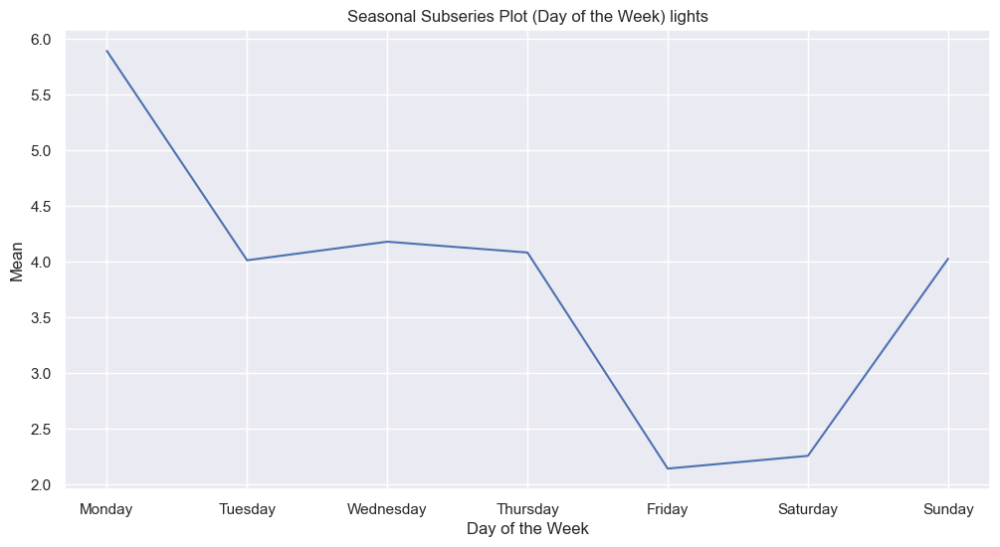

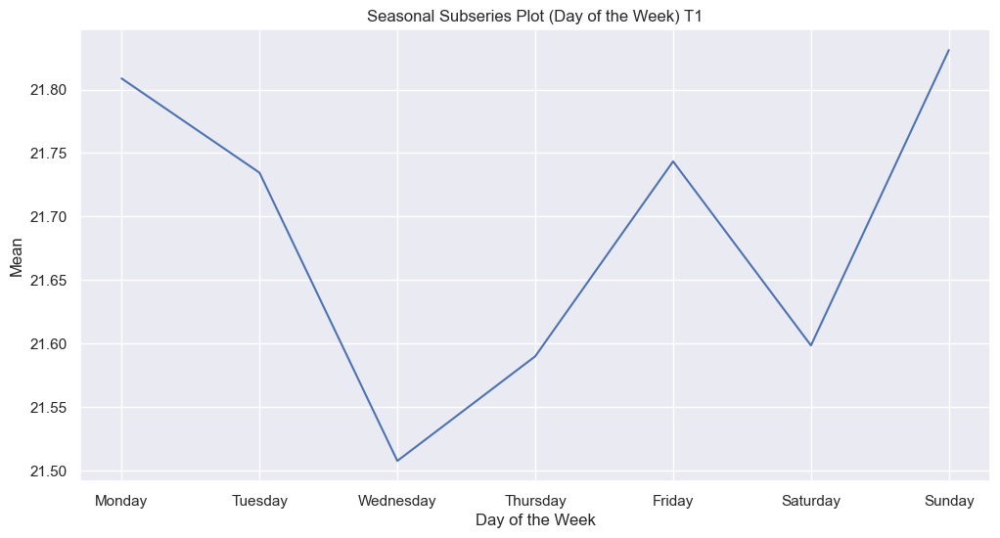

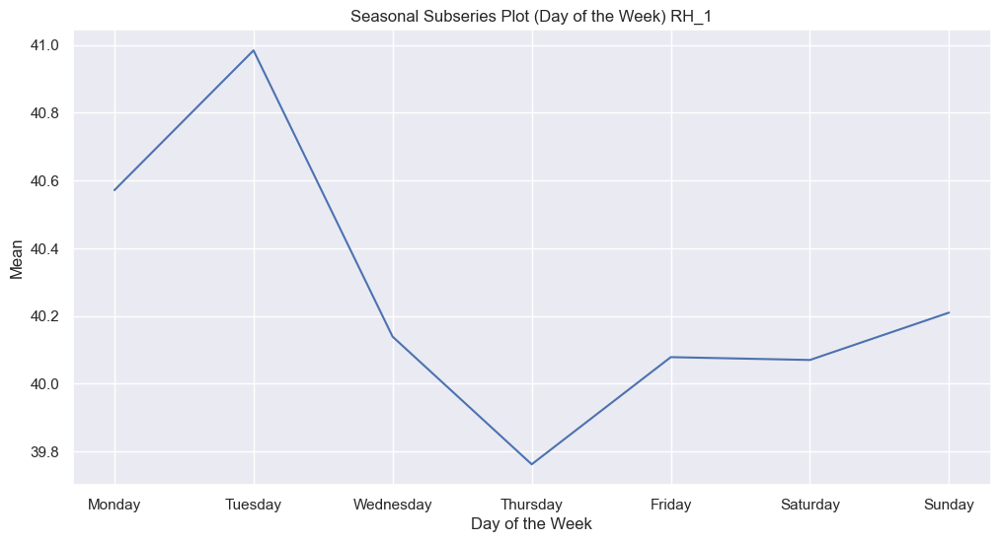

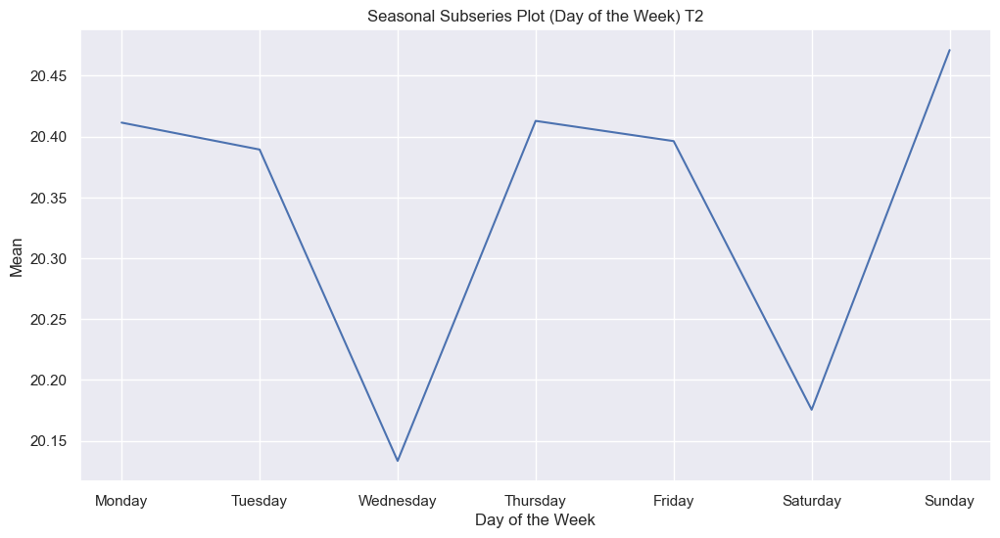

...

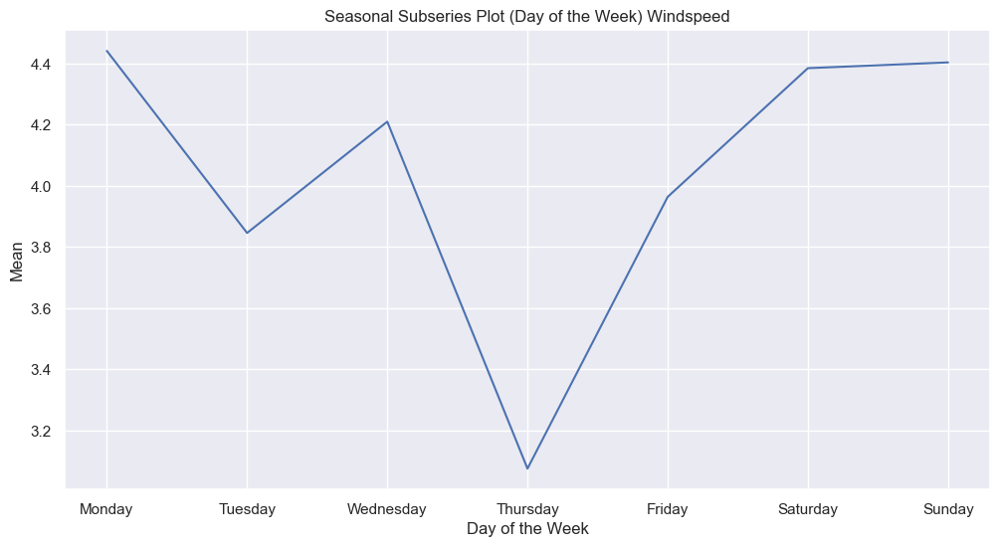

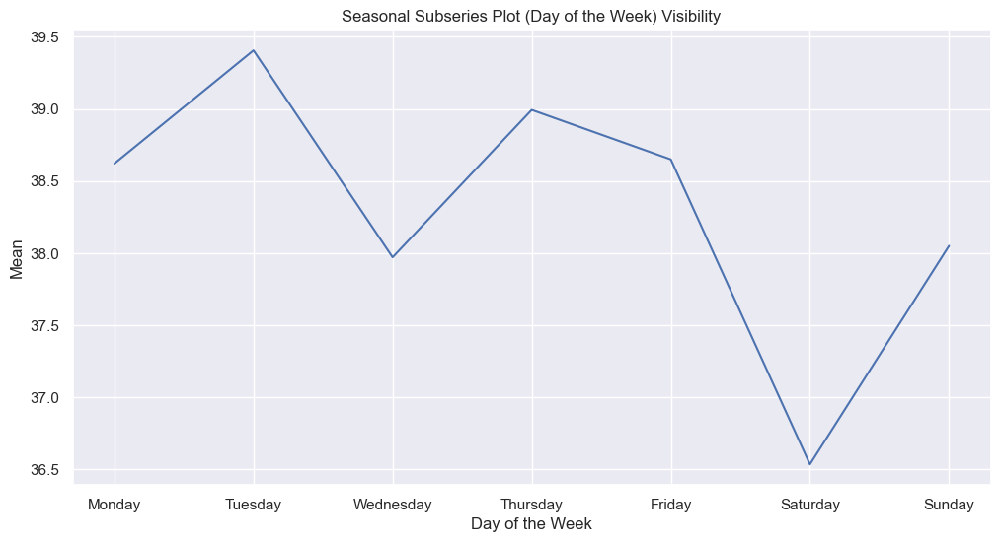

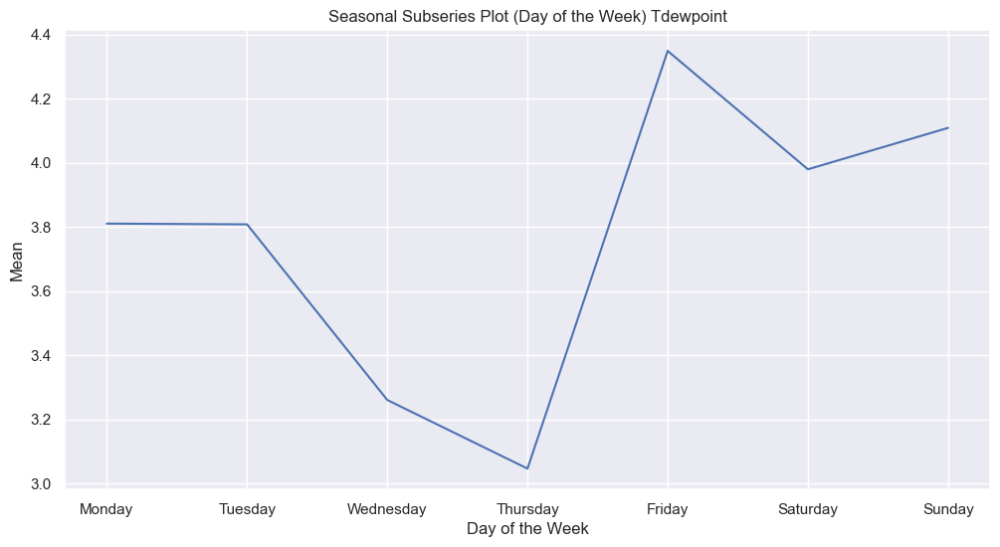

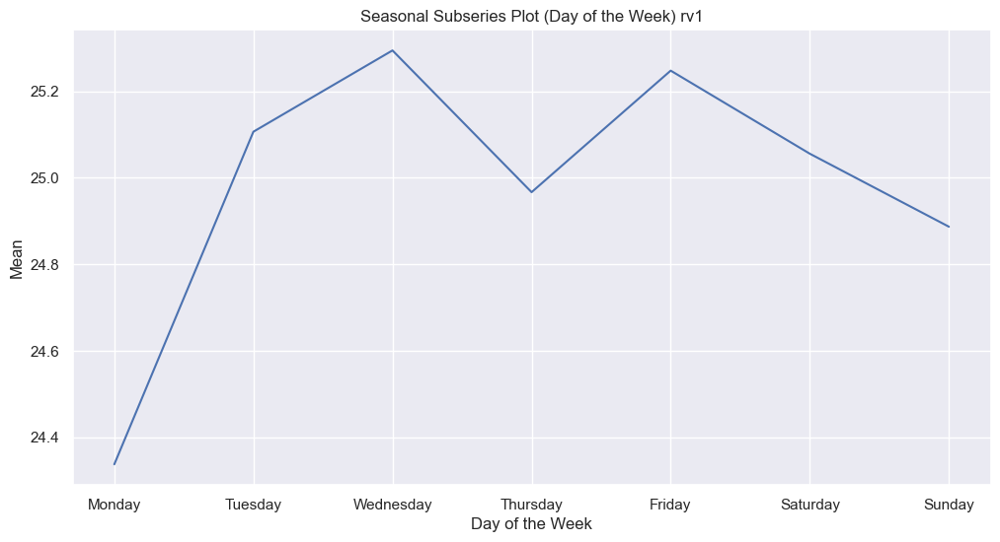

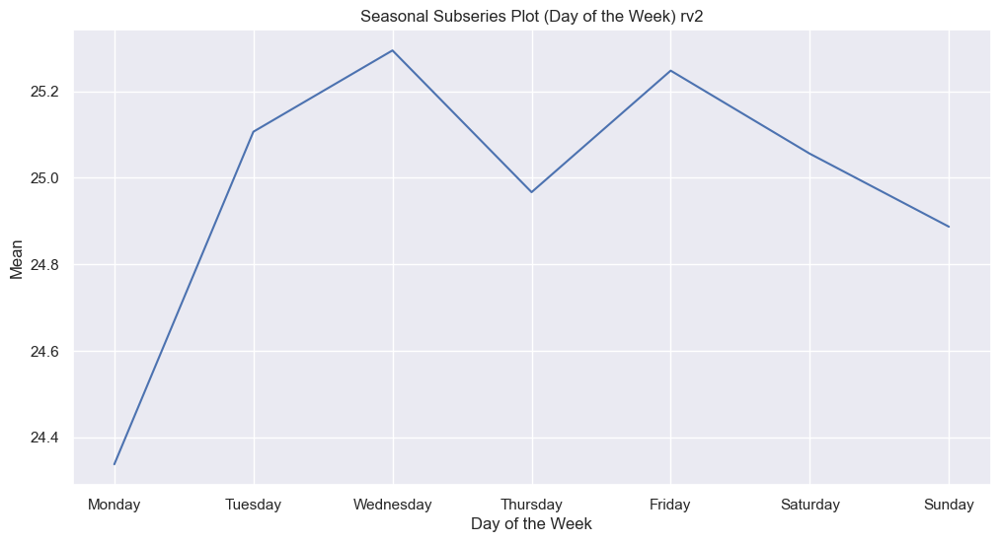

In [546]:
# Map integers to days of the week for better readability
day_of_week_labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for column in data.columns:
    # Group data by day of the week and calculate the mean energy usage
    seasonal_subseries = data.groupby(data.index.dayofweek)[column].mean()
    # Plot the seasonal subseries
    plt.figure(figsize=(12, 6))
    seasonal_subseries.plot(kind='line')
    plt.title('Seasonal Subseries Plot (Day of the Week) '+ column)
    plt.xlabel('Day of the Week')
    plt.ylabel('Mean')
    plt.xticks(range(7), day_of_week_labels)  # Replace x-tick labels with day of the week labels
    plt.show()

In [547]:
# Plot other features over time to observe their relationships with the target variable
features_to_plot = ['lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2']  

This code below plots a histogram and a kernel density estimate (KDE) for each feature specified in features_to_plot. For each feature, a new plot is created, showing the distribution of the data as a histogram (with 30 bins) and a density curve overlaid. The histogram provides insights into the frequency distribution of the data, while the KDE curve shows the smooth estimated probability density function. The code includes titles and axis labels for each plot.

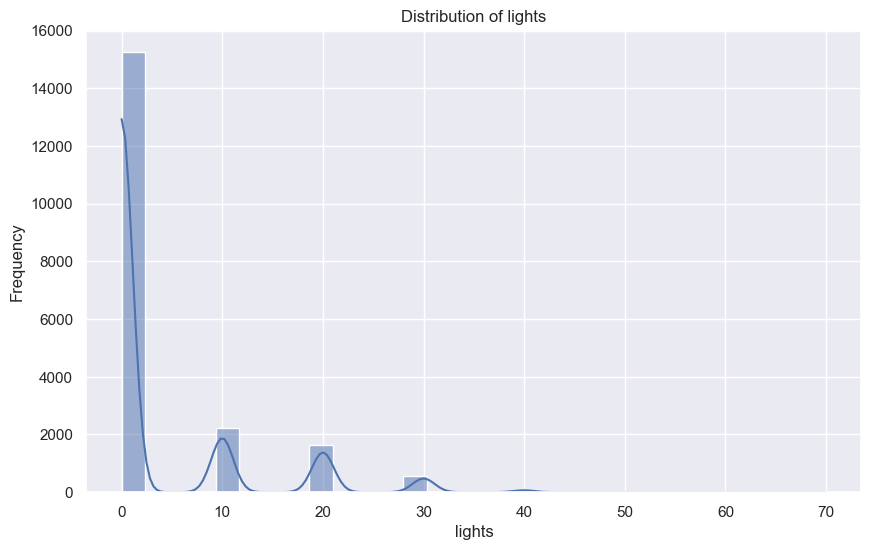

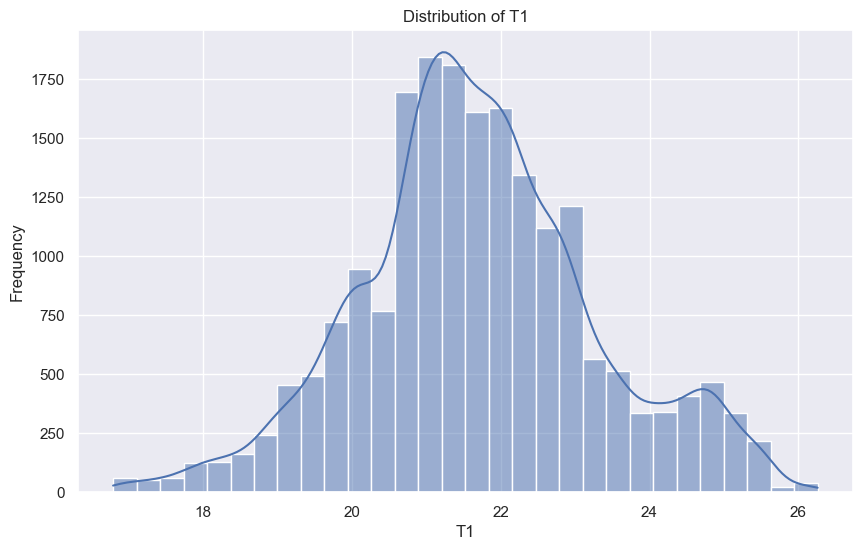

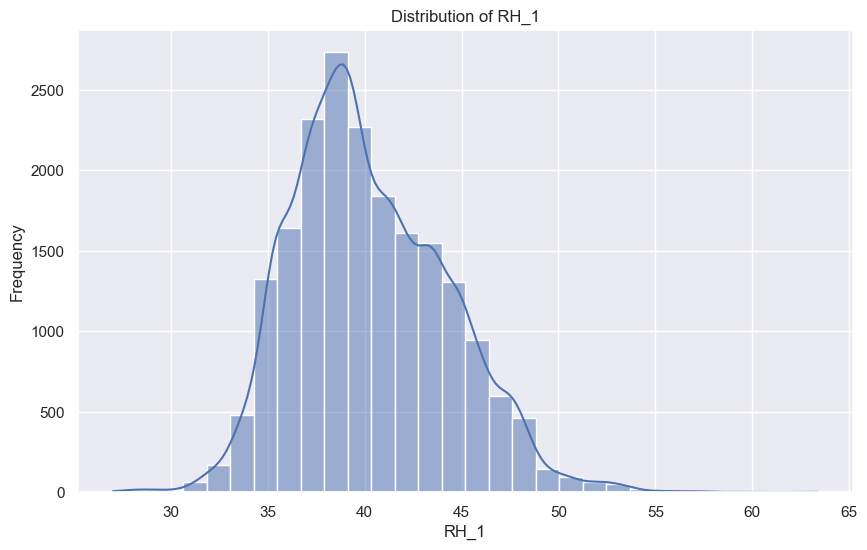

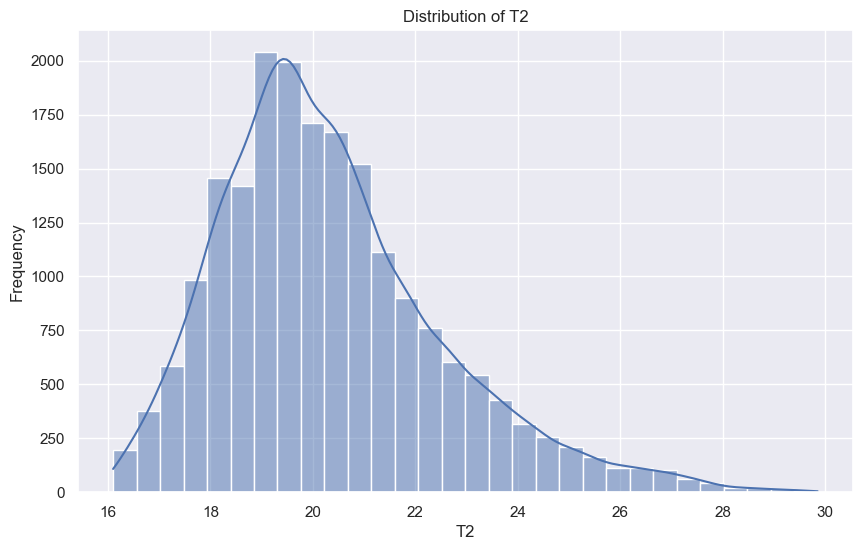

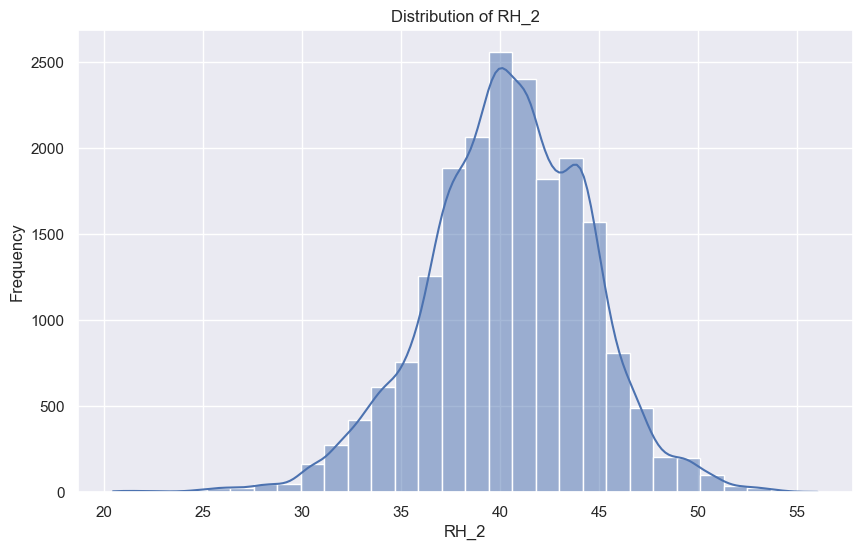

...

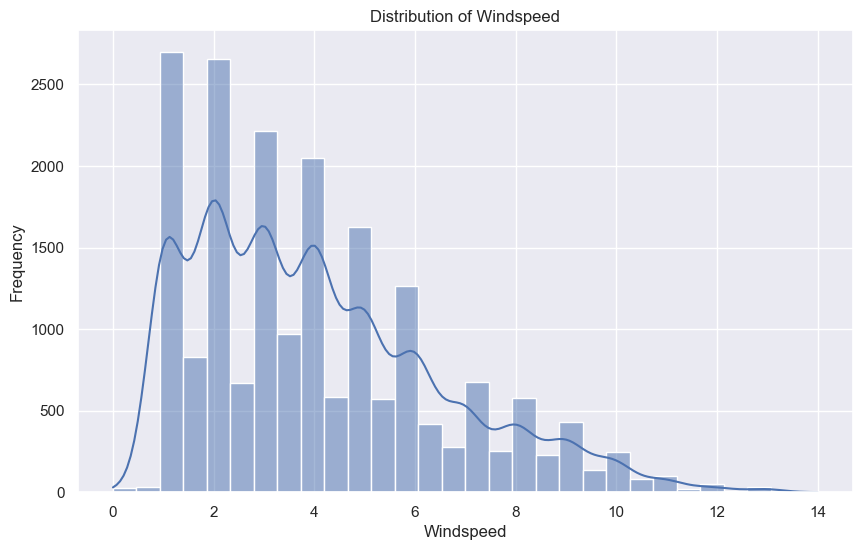

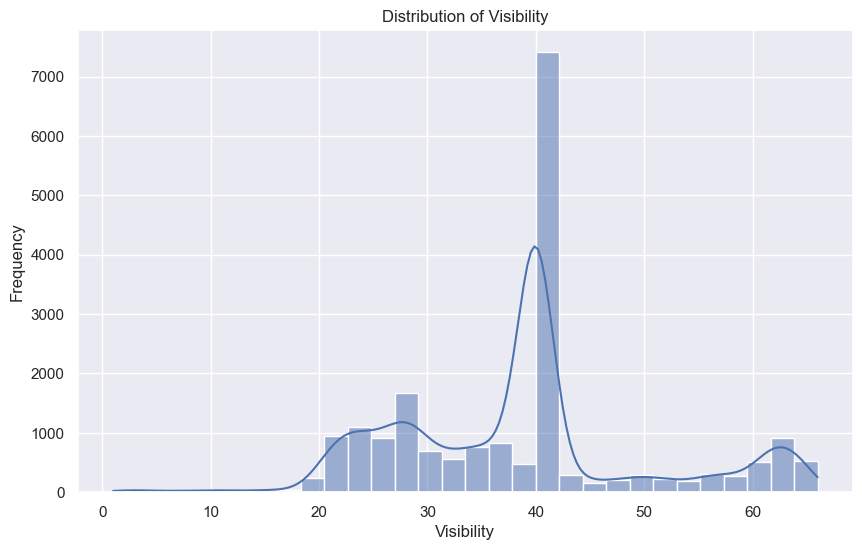

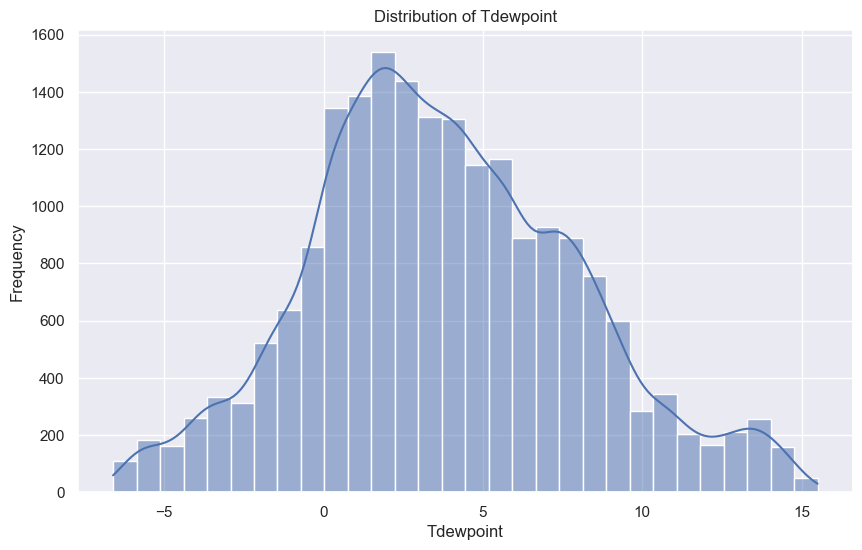

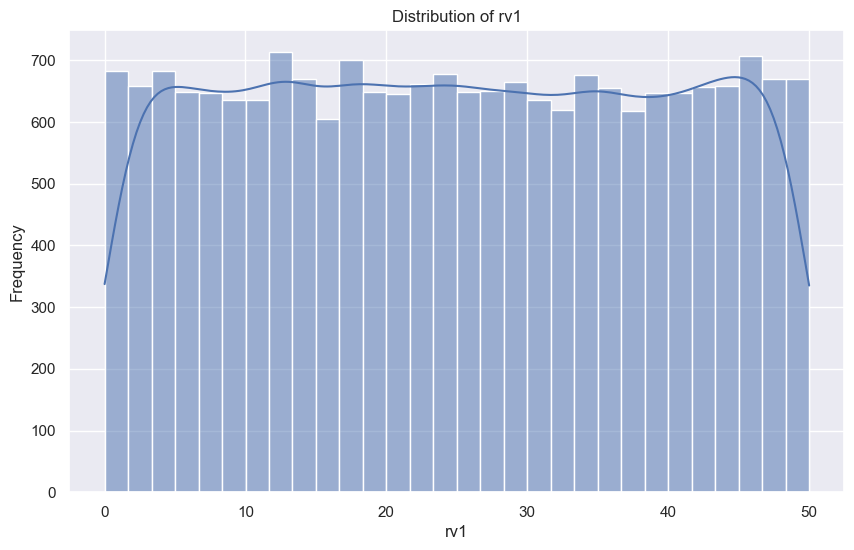

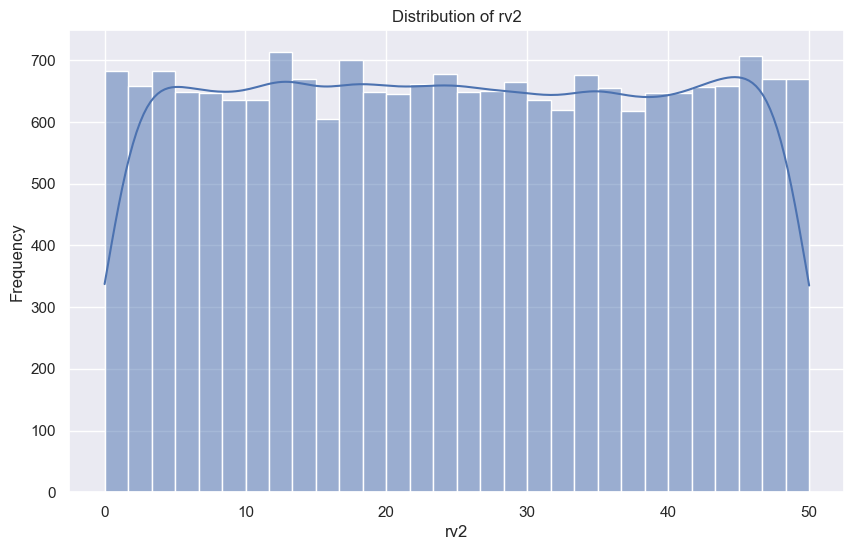

In [548]:
for column in features_to_plot:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], bins=30, kde=True)  # KDE shows the density plot
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

This code creates a time series plot for each specified feature in features_to_plot. For each feature, a new figure is created with a plot of the feature's values over time, using the data's index as the x-axis. The code sets the title, x-axis label, y-axis label, and a legend for each plot. This visual representation helps to understand how each feature changes over time and identify potential trends, patterns, or anomalies.

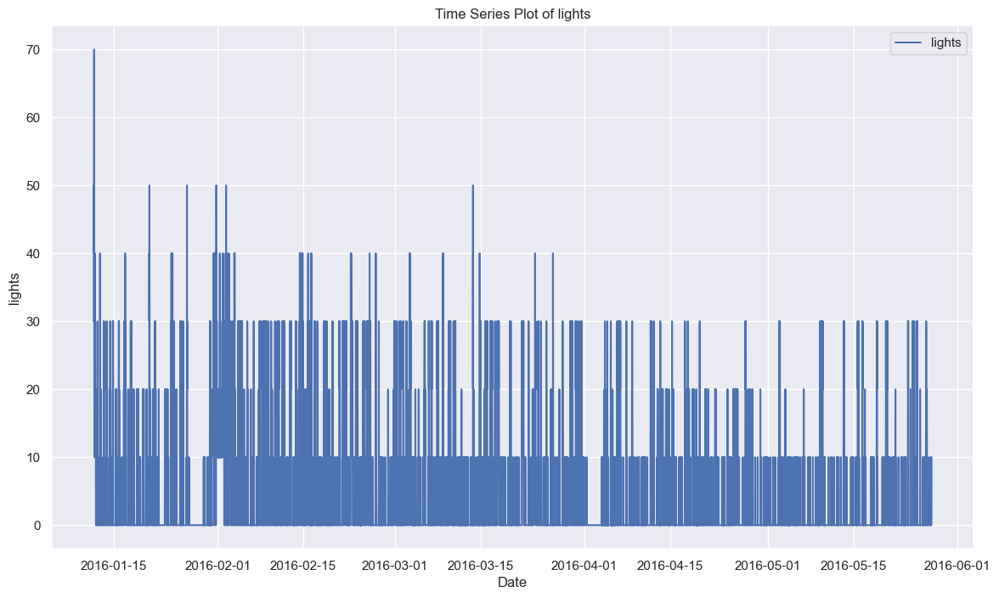

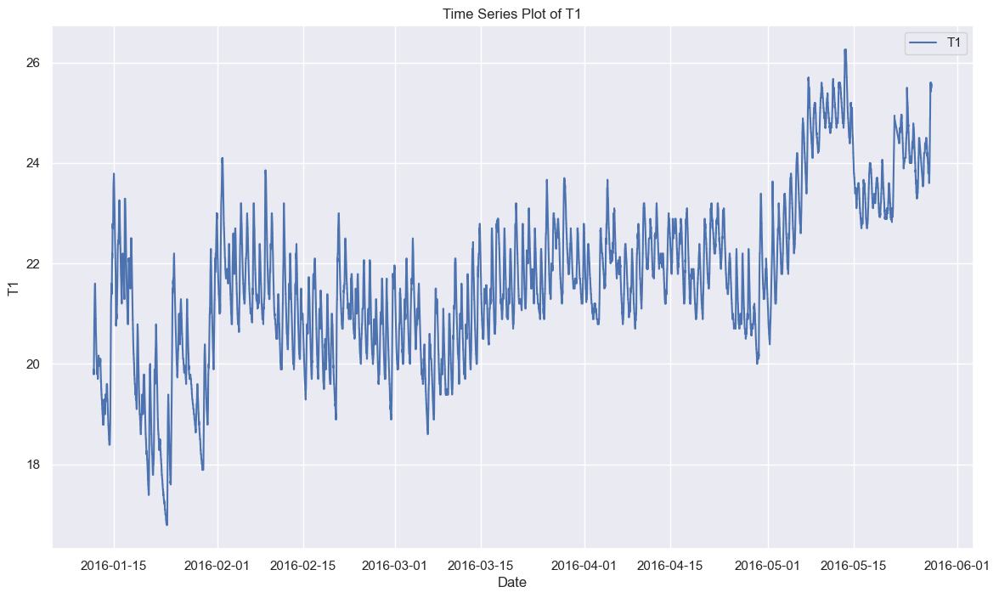

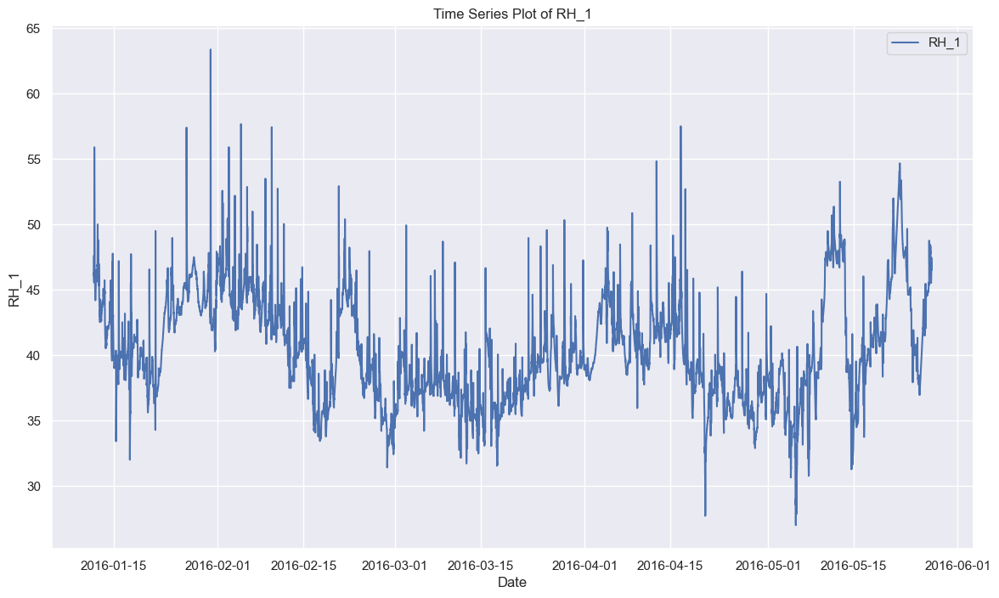

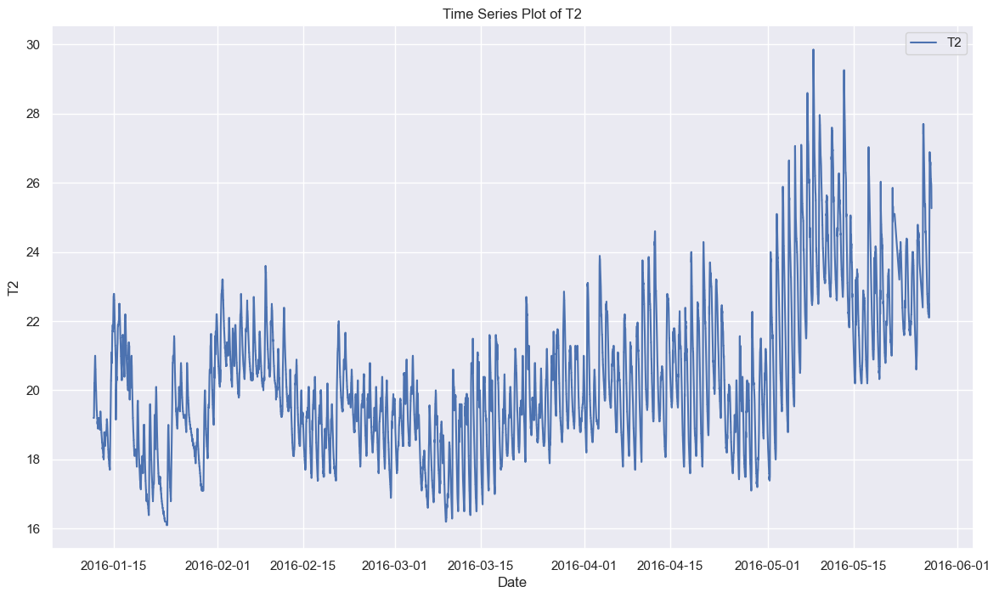

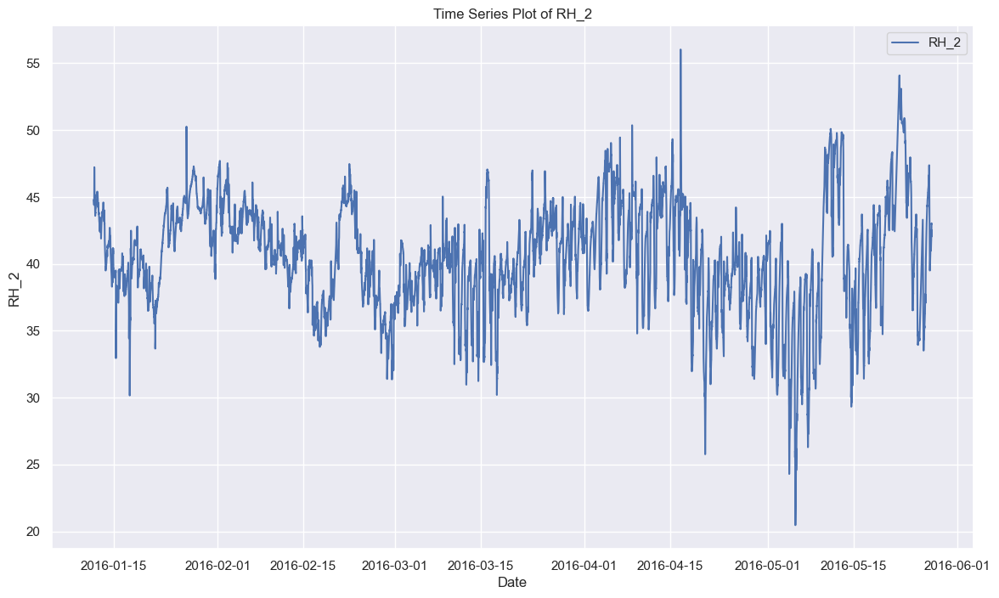

...

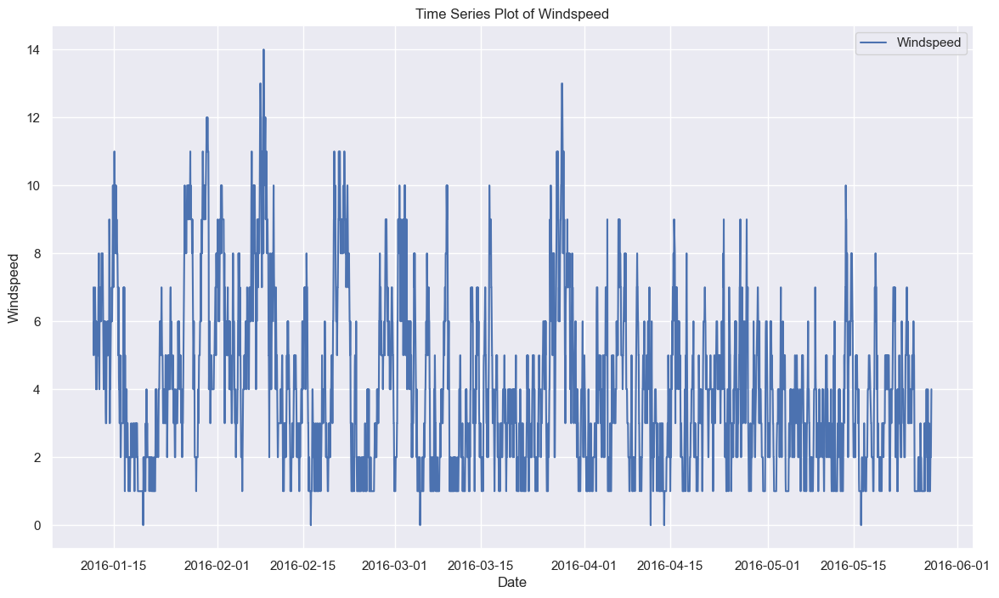

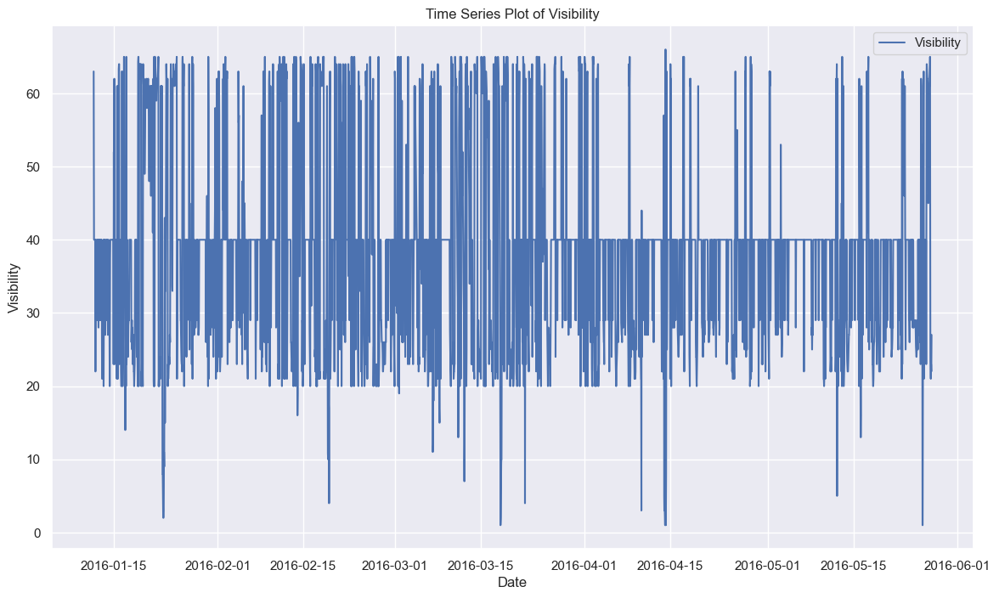

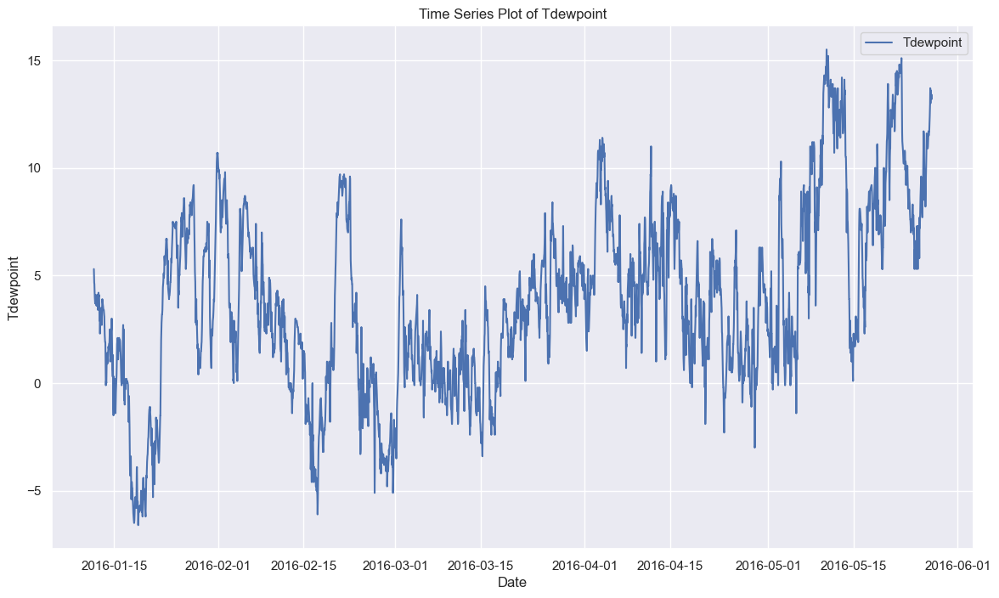

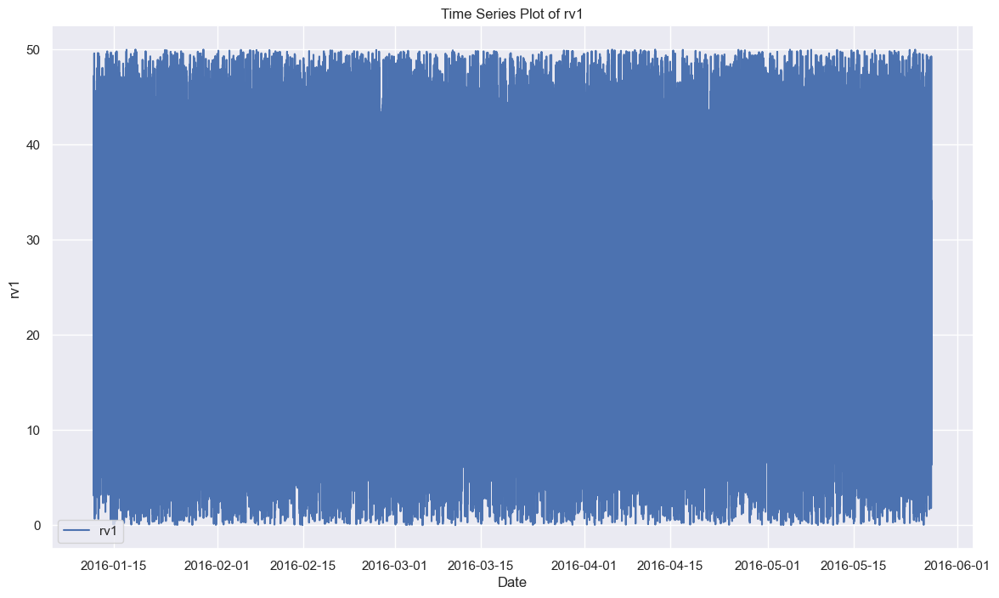

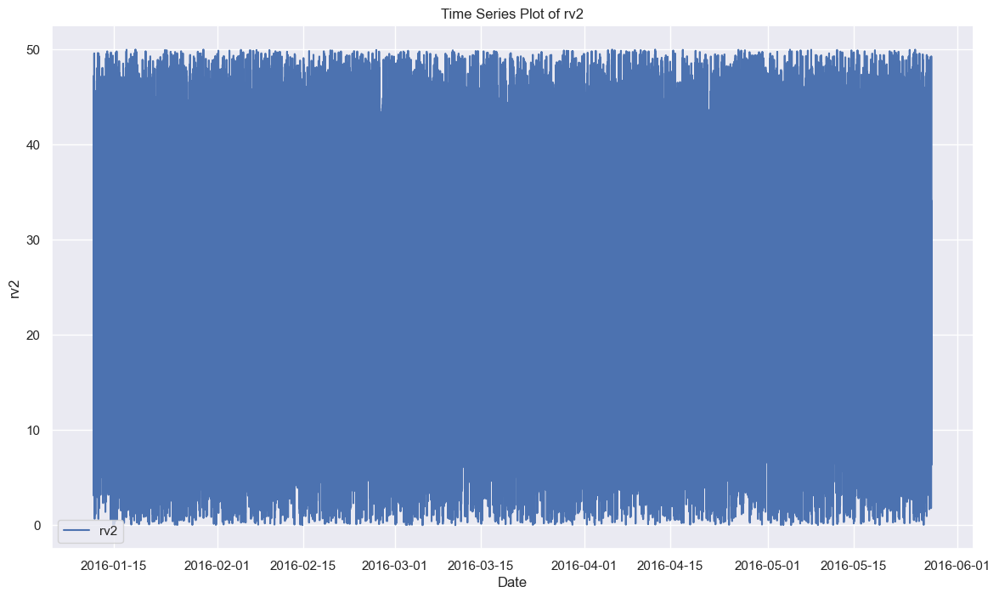

In [549]:
for feature in features_to_plot:
    plt.figure(figsize=(14, 8))
    plt.plot(data.index, data[feature], label=feature)
    plt.title(f'Time Series Plot of {feature}')
    plt.xlabel('Date')
    plt.ylabel(feature)
    plt.legend()
    plt.show()

This code creates scatter plots for each specified feature in features_to_plot, with the target variable Appliances as the y-axis and the feature as the x-axis. The points in the scatter plot are colored according to the values of the target variable Appliances using the viridis color palette. This visualization helps in understanding the relationship between each feature and the target variable, as well as any potential patterns or trends in the data.

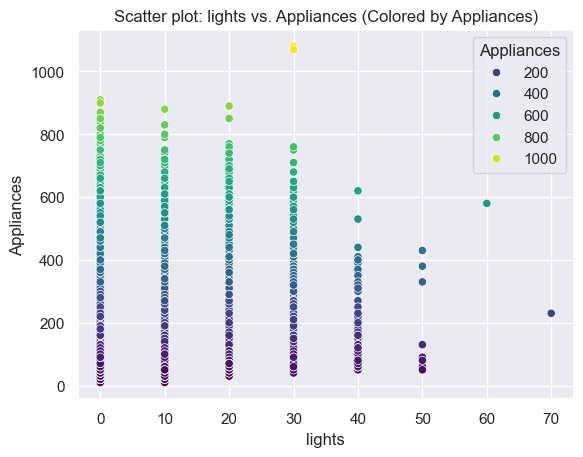

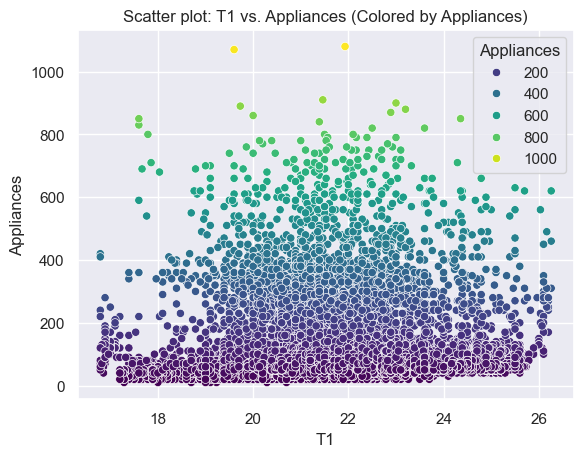

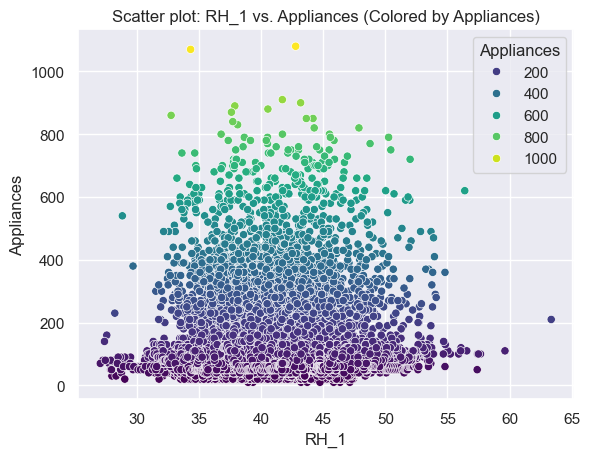

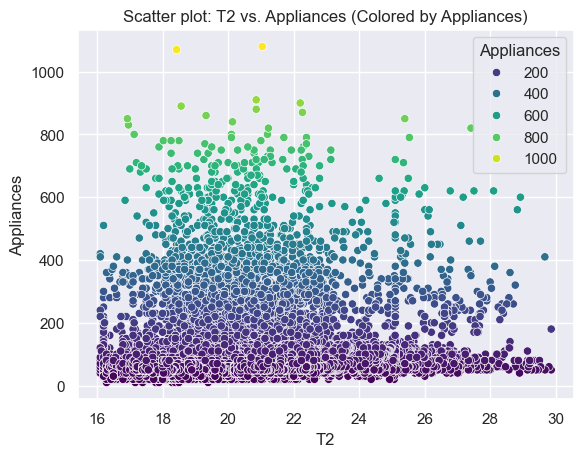

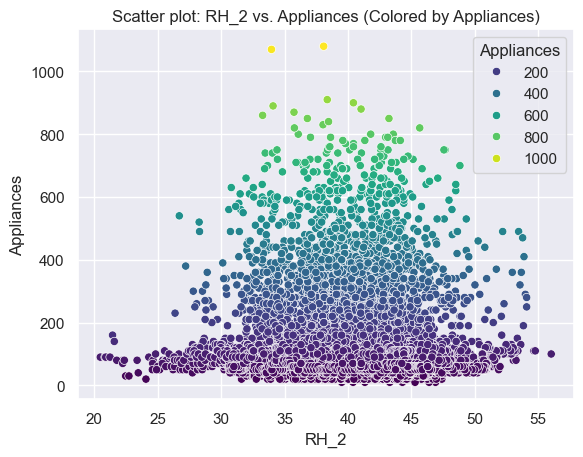

...

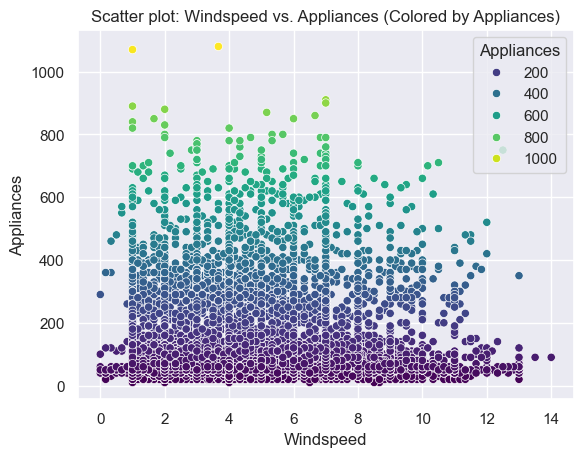

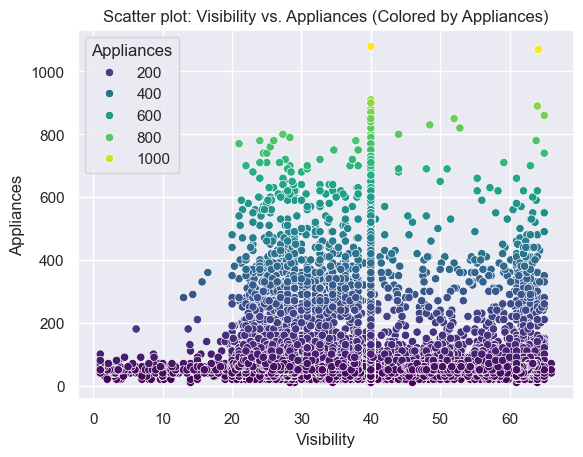

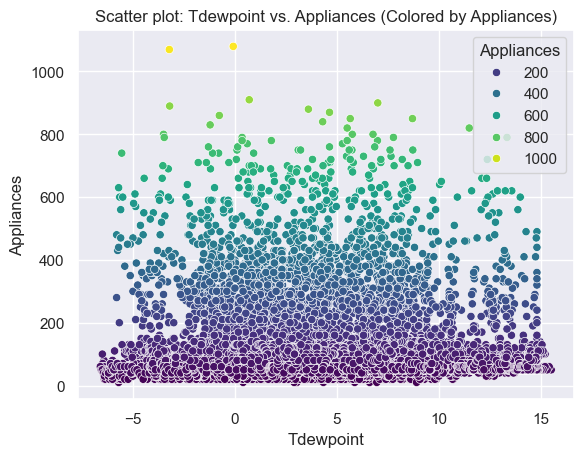

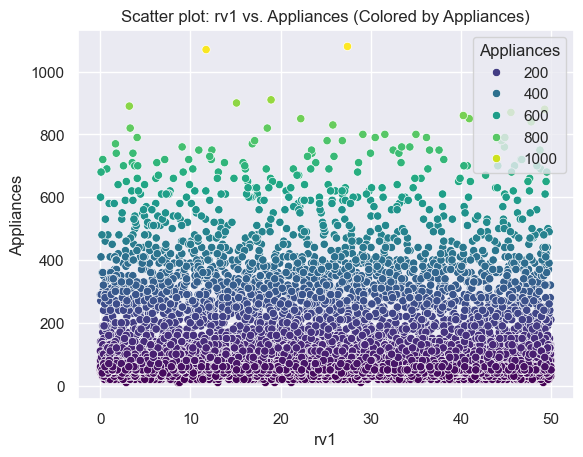

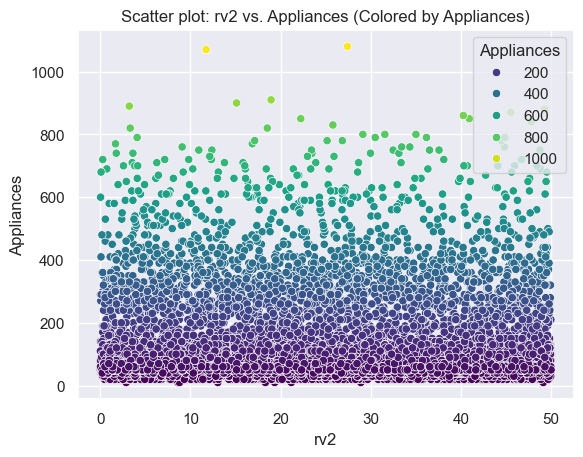

In [550]:
# Create scatter plots with different colors for the target variable
for feature in features_to_plot:
    sns.scatterplot(data=data, x=feature, y=data['Appliances'], hue=data['Appliances'], palette='viridis')
    plt.title(f'Scatter plot: {feature} vs. Appliances (Colored by Appliances)')
    plt.xlabel(feature)
    plt.ylabel('Appliances')
    plt.show()

The code defines a function identify_outliers_with_boxplot(df) that identifies outliers in a pandas DataFrame df for each column (feature) using boxplots. For each column, it calculates the interquartile range (IQR) to determine the lower and upper whiskers, which define the range of non-outlier values. Data points outside this range are considered outliers. The function plots a boxplot for each feature, highlighting the outliers, and returns a dictionary where each key is a column name and each value is a series of outliers for that column.

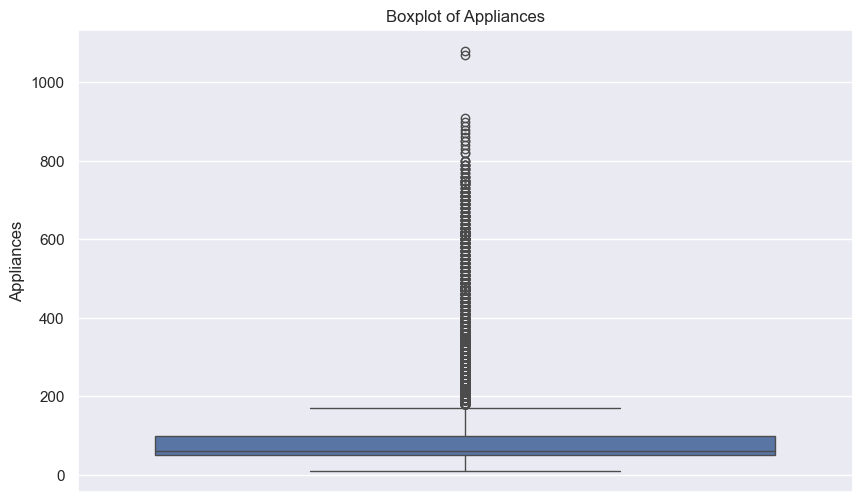

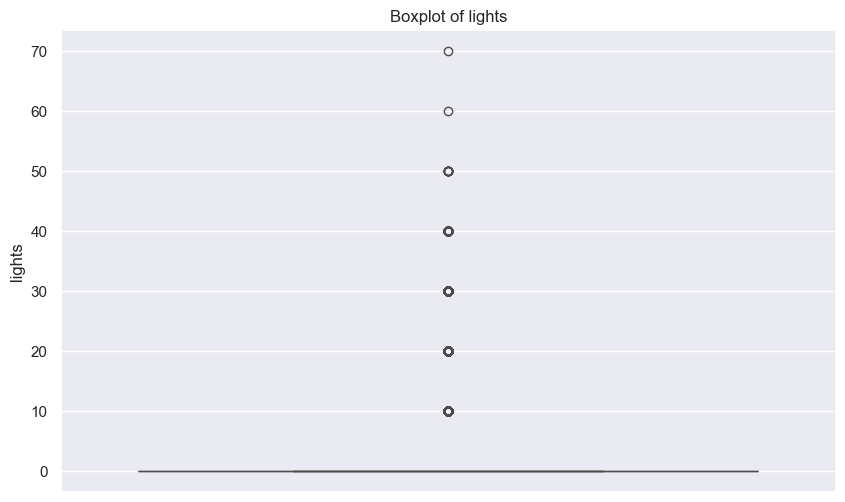

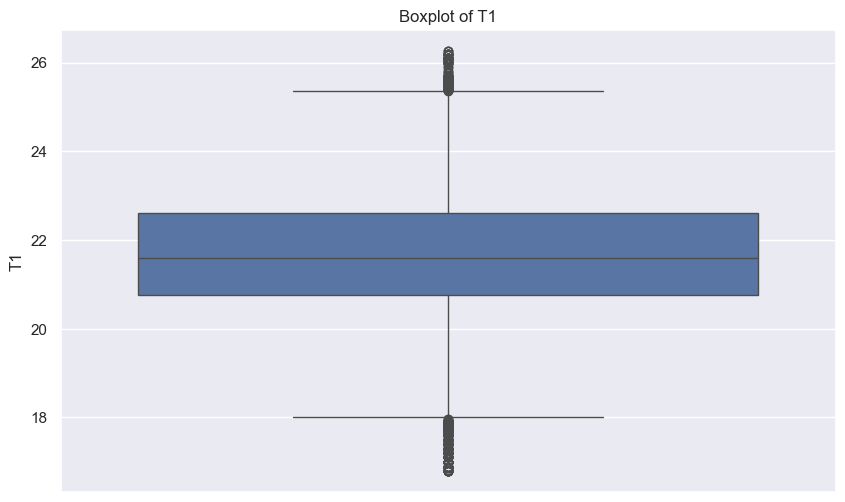

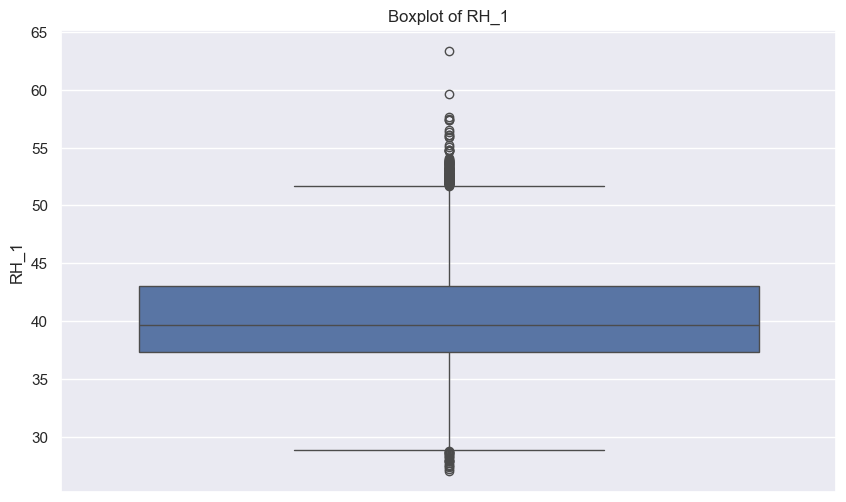

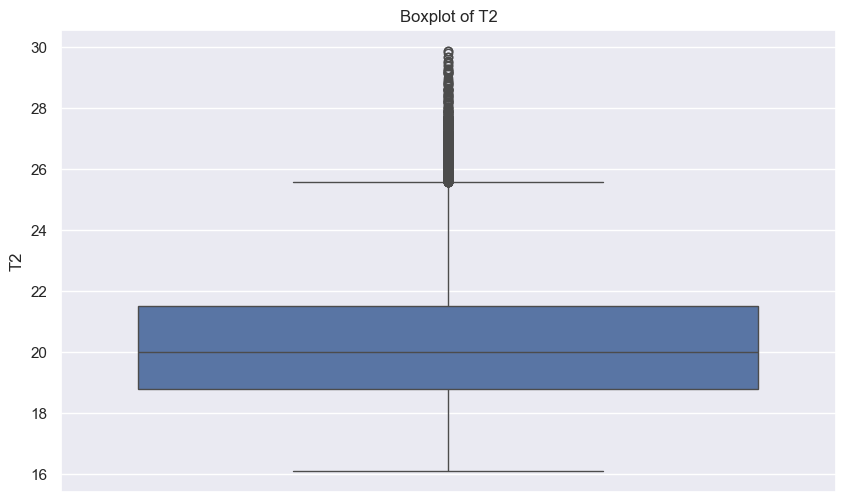

...

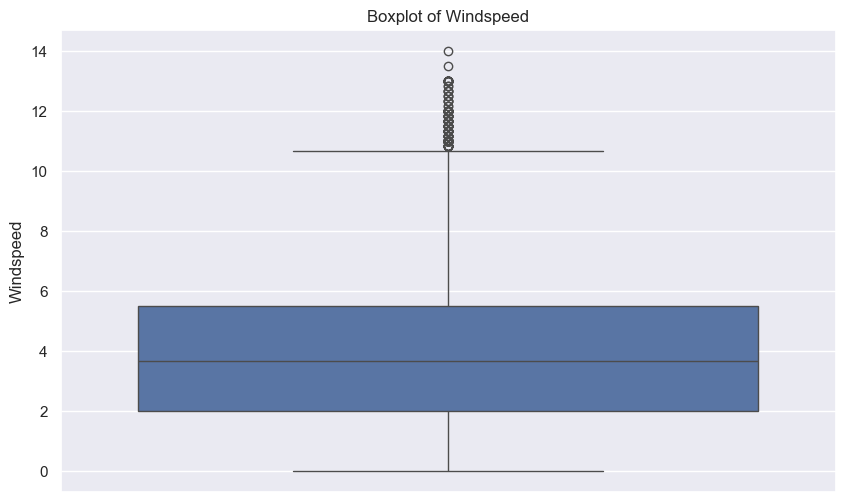

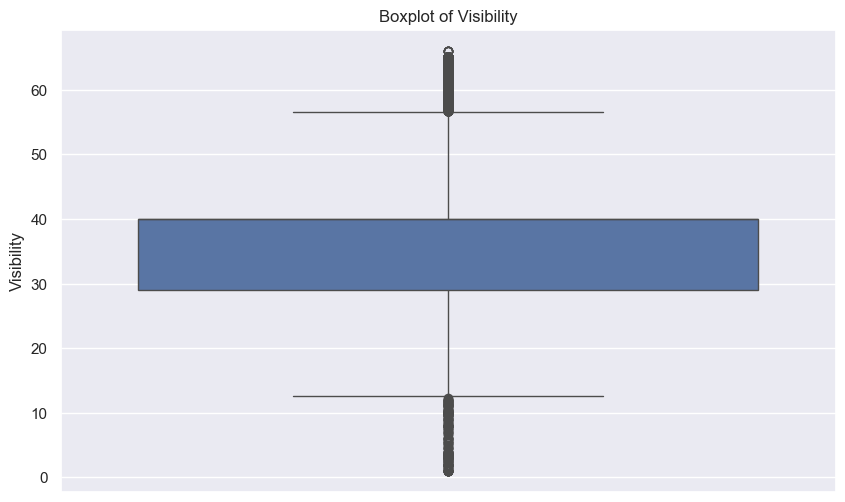

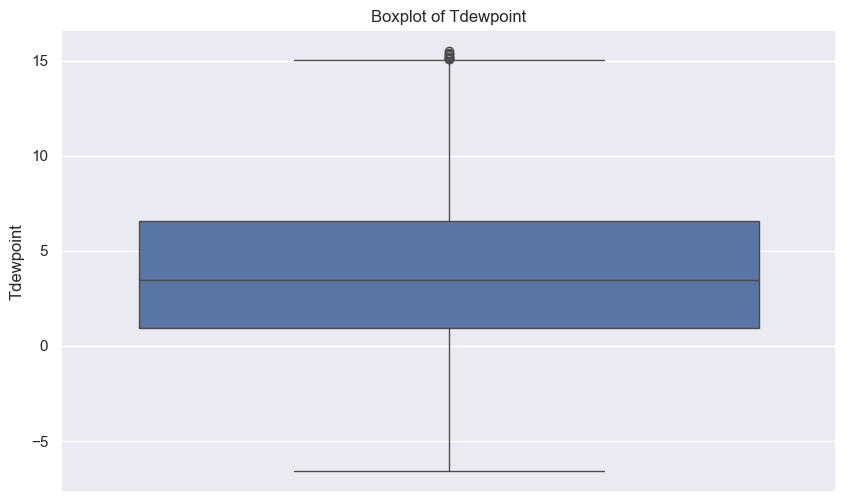

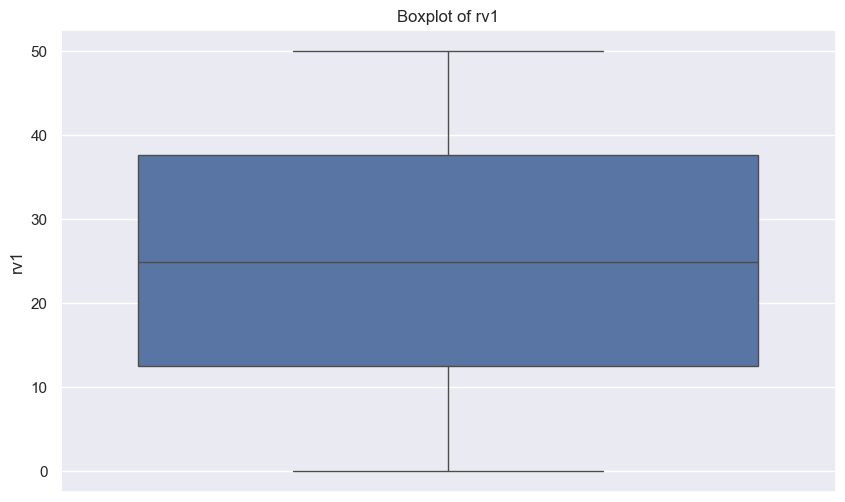

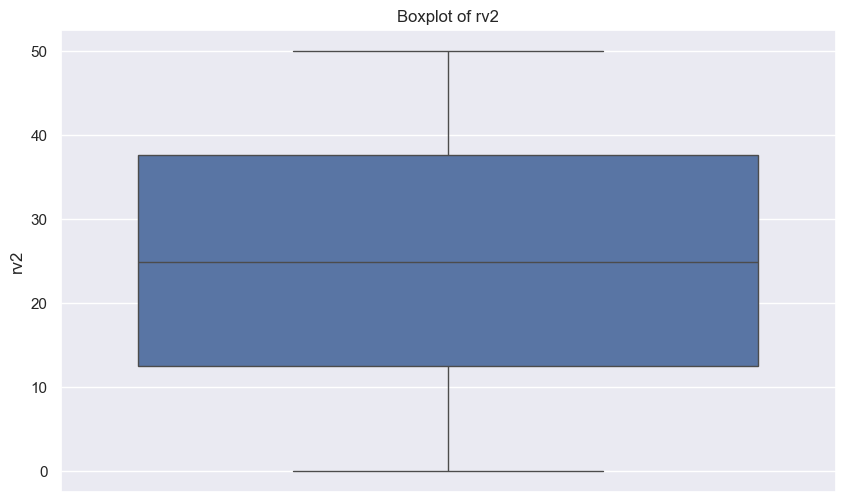

In [551]:
# Function to identify outliers using boxplots
def identify_outliers_with_boxplot(df):
    # Dictionary to store outliers for each feature
    outliers_dict = {}
    
    # Iterate through each feature (column) in the DataFrame
    for column in df.columns:
        plt.figure(figsize=(10, 6))
        
        # Create a boxplot for the current feature
        sns.boxplot(data=df[column])
        
        # Calculate the first quartile (Q1) and third quartile (Q3)
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        
        # Calculate the interquartile range (IQR)
        IQR = Q3 - Q1
        
        # Calculate the lower and upper whiskers
        lower_whisker = Q1 - 1.5 * IQR
        upper_whisker = Q3 + 1.5 * IQR
        
        # Find outliers (data points outside the whiskers)
        outliers = df[(df[column] < lower_whisker) | (df[column] > upper_whisker)][column]
        
        # Store the outliers in the dictionary
        if not outliers.empty:
            outliers_dict[column] = outliers
        
        # Show the boxplot
        plt.title(f'Boxplot of {column}')
        plt.show()
    
    # Return the dictionary containing outliers for each feature
    return outliers_dict

# Call the function and get the outliers for each feature
outliers_dict = identify_outliers_with_boxplot(data)

The code applies a moving interquartile range (IQR) technique to identify and highlight outliers in a time series dataset. By specifying a window size (144 intervals, or a full day in 10-minute intervals), the function calculates a rolling IQR for a specified column. It identifies outliers as data points falling below a calculated lower bound (Q1 - 1.5 * IQR) or above an upper bound (Q3 + 1.5 * IQR). The function returns a boolean mask indicating outliers. Another function plots the time series data of each feature in the dataset, highlighting outliers in red for easy visualization. This approach helps in analyzing the data for anomalies and understanding its behavior over time.

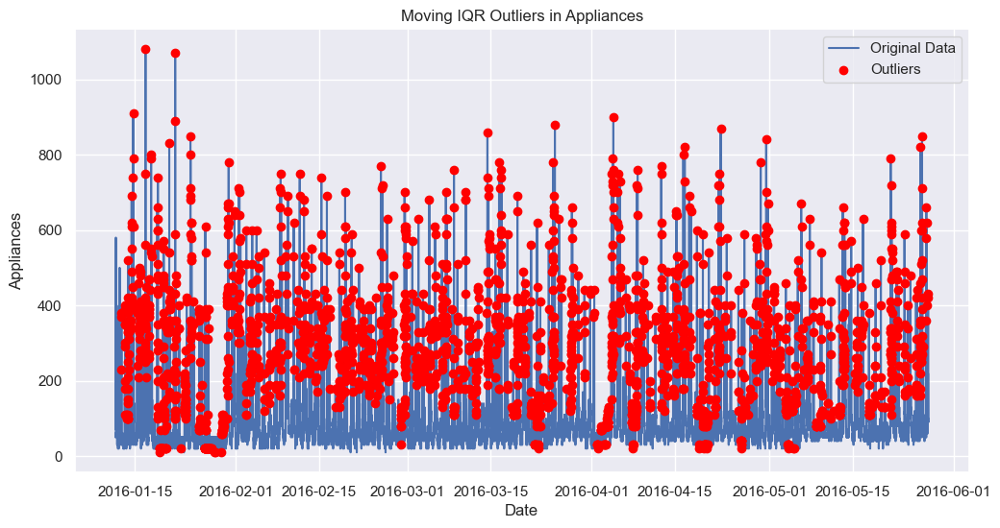

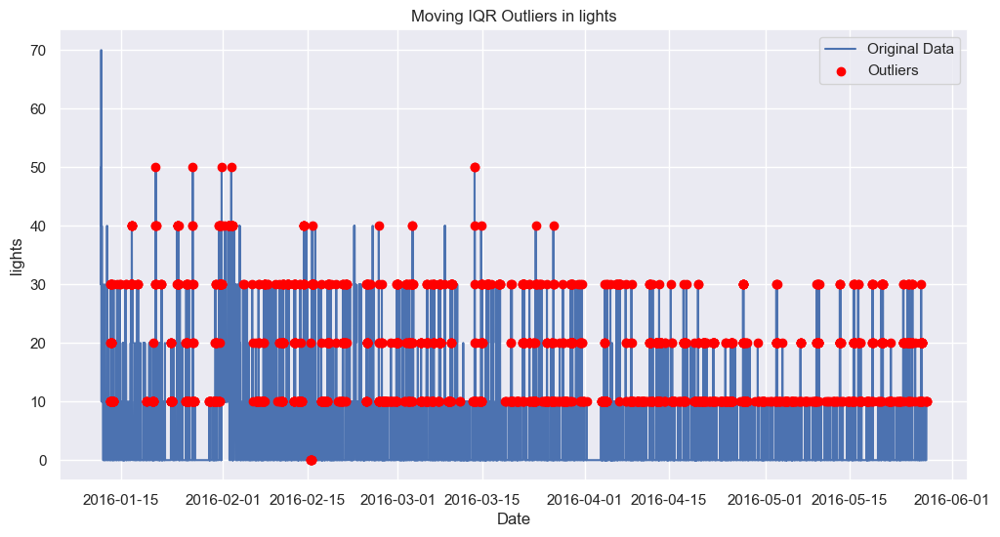

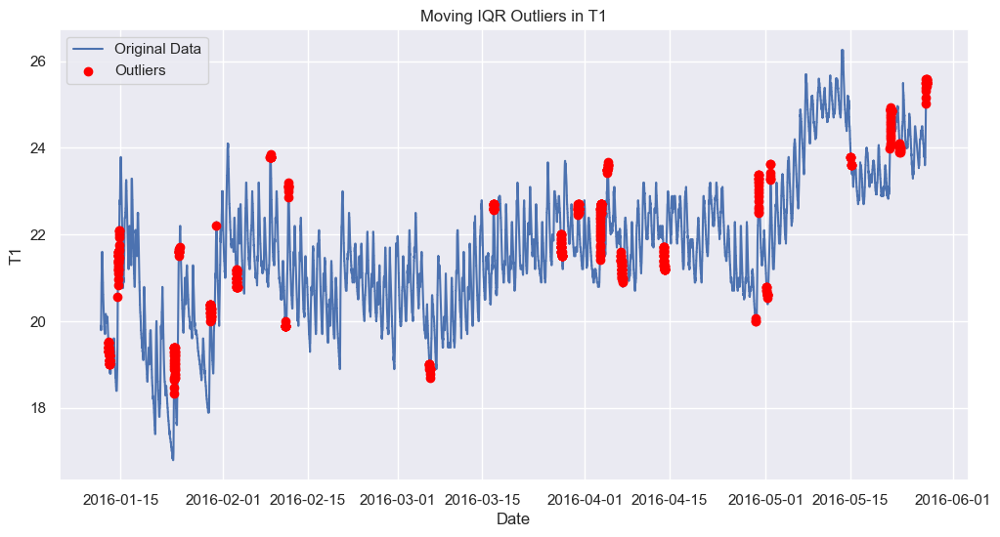

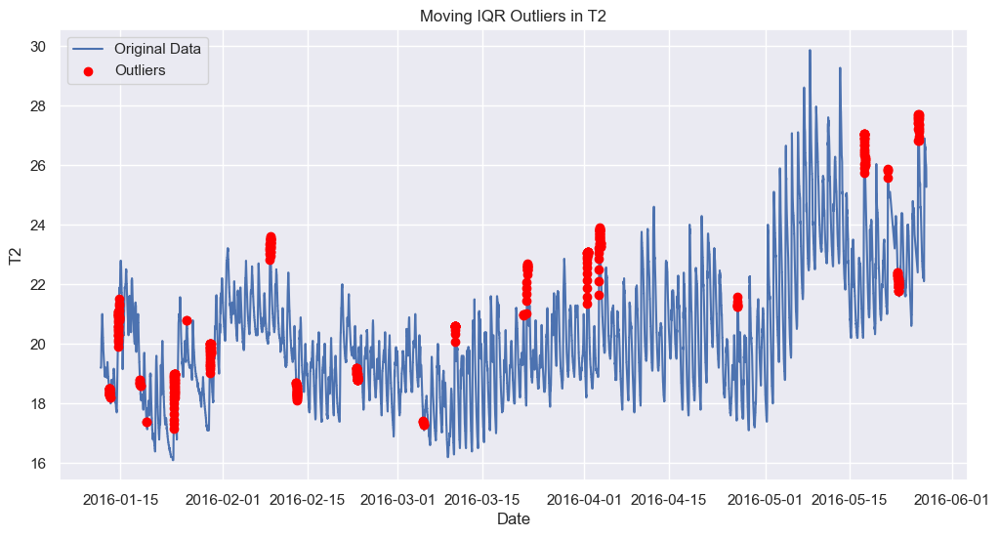

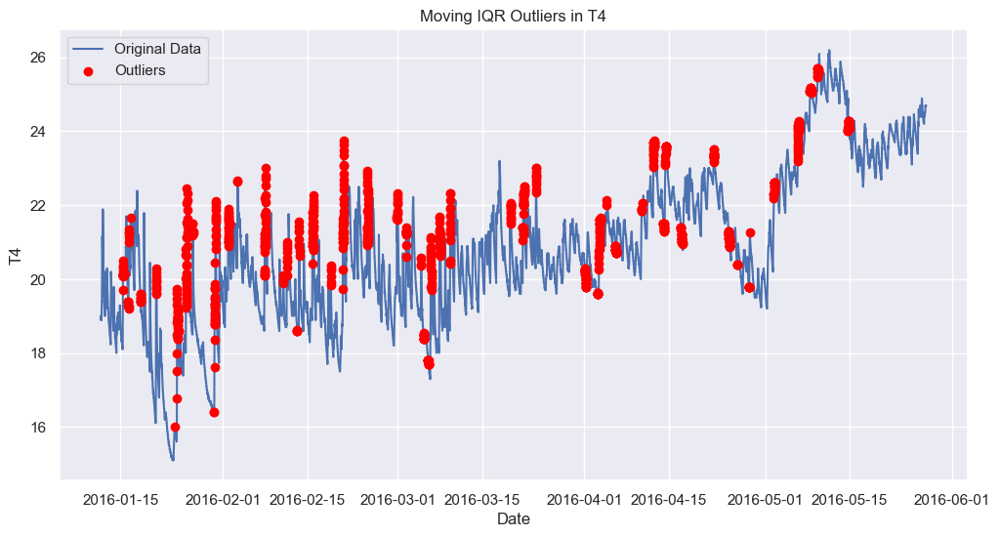

...

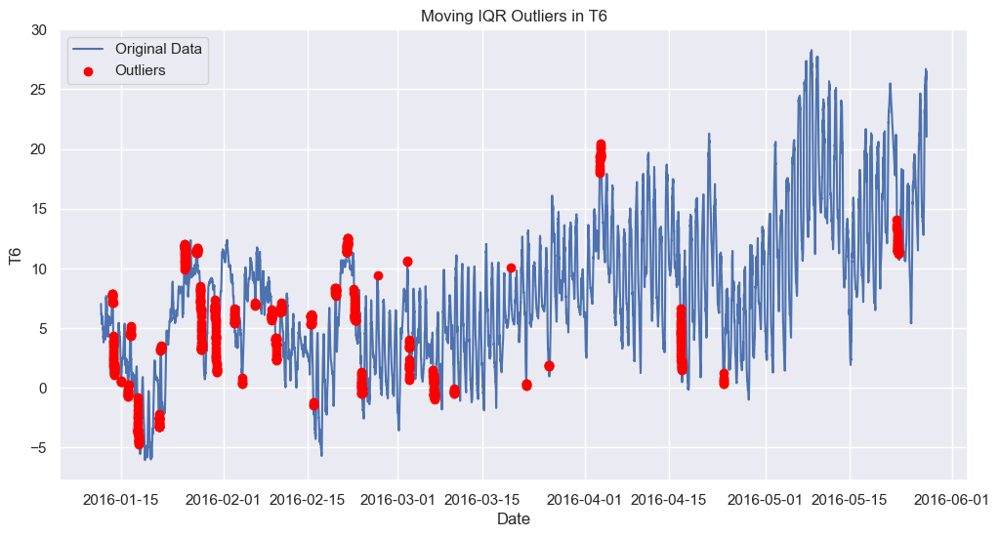

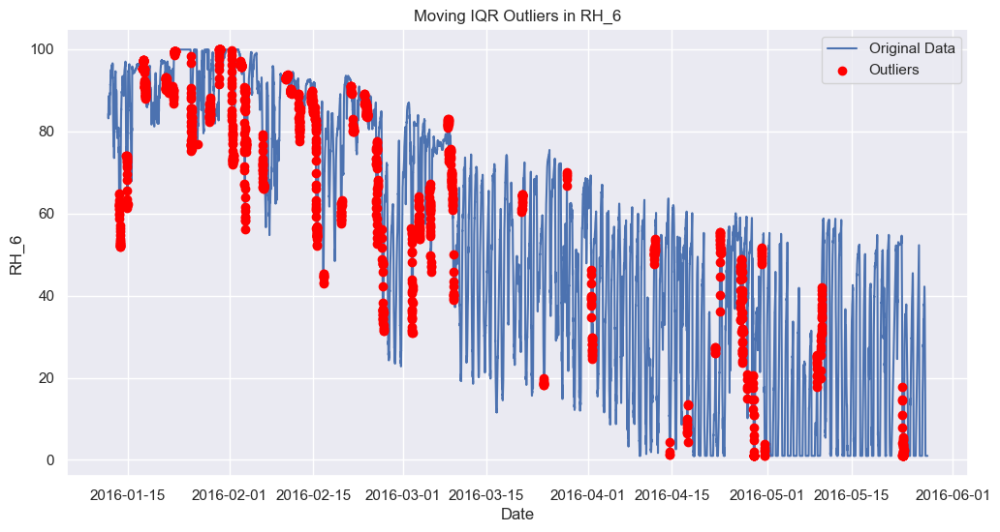

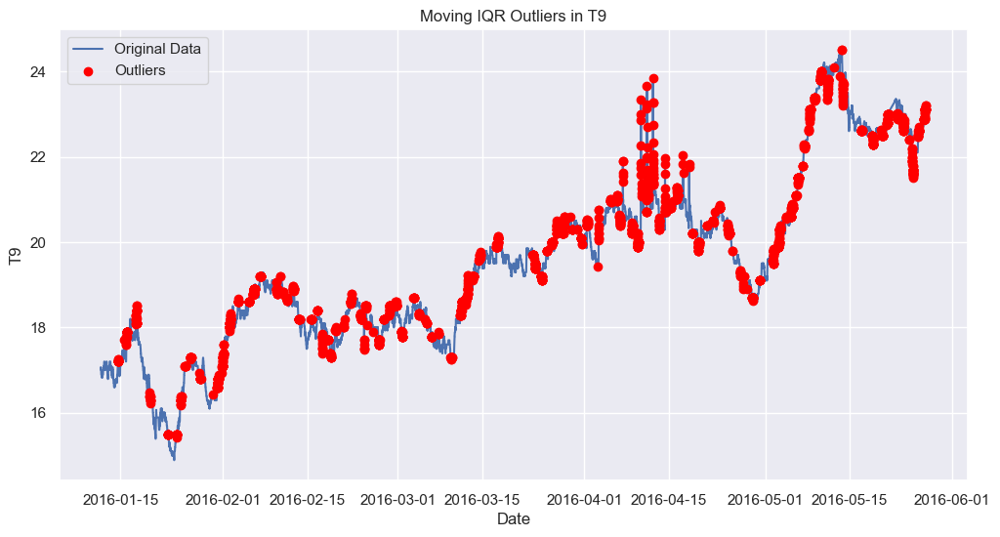

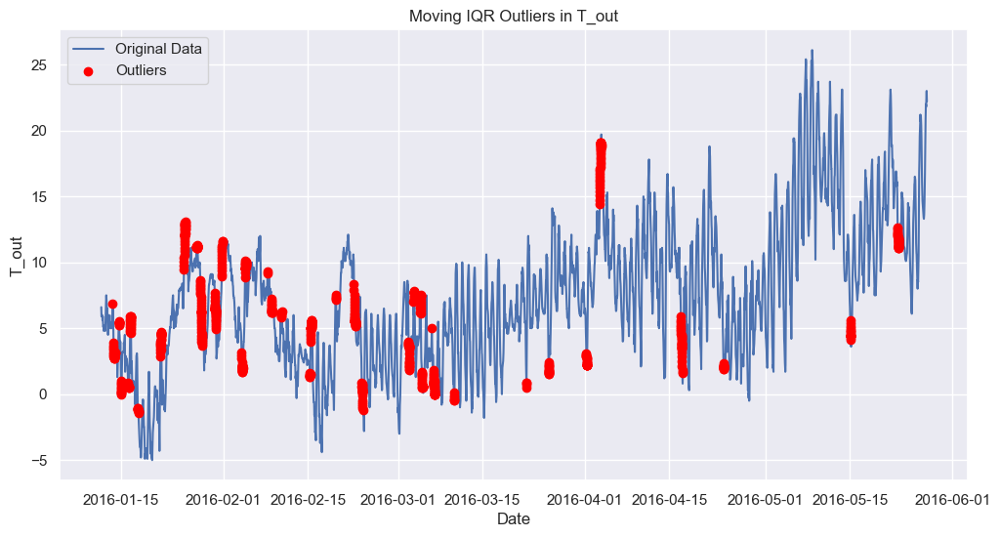

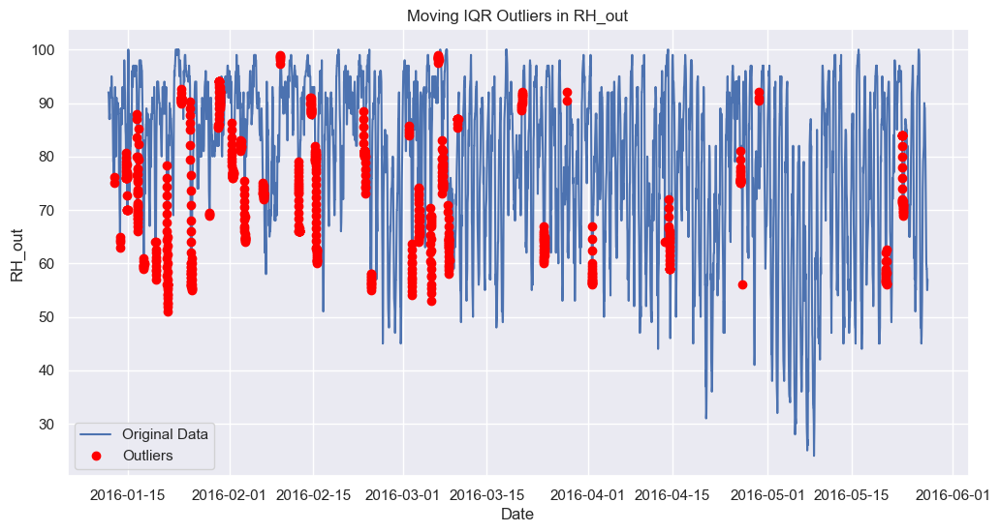

In [601]:
# Define the window size in terms of 10-minute intervals for a full day (24 hours)
window_size = 144  # 24 hours * 6 intervals per hour = 144 intervals

# Function to calculate moving IQR and identify outliers
def moving_iqr_outliers(data, column, window_size):
    # Calculate rolling IQR
    rolling_q1 = data[column].rolling(window=window_size).quantile(0.25)
    rolling_q3 = data[column].rolling(window=window_size).quantile(0.75)
    rolling_iqr = rolling_q3 - rolling_q1
    
    # Calculate upper and lower bounds
    upper_bound = rolling_q3 + 1.5 * rolling_iqr
    lower_bound = rolling_q1 - 1.5 * rolling_iqr
    
    # Identify outliers
    outliers = (data[column] < lower_bound) | (data[column] > upper_bound)
    
    # Return the boolean mask indicating outliers
    return outliers

# Function to plot the time series data with outliers highlighted
def plot_with_outliers(data, column, outliers):
    plt.figure(figsize=(12, 6))
    plt.plot(data.index, data[column], label='Original Data')
    
    # Highlight outliers
    plt.scatter(data.index[outliers], data[column][outliers], color='red', label='Outliers', zorder=2)
    
    plt.title(f'Moving IQR Outliers in {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend()
    plt.show()

# Apply the moving IQR technique to all features in the dataset
for column_name in data.columns:
    # Calculate outliers using moving IQR
    outliers_mask = moving_iqr_outliers(data, column_name, window_size)
    
    # Plot the time series data with outliers highlighted
    plot_with_outliers(data, column_name, outliers_mask)

After examining both boxplots for outlier detection and using a moving IQR approach, we've observed that our data contains a significant number of outliers. Removing them would not be a suitable option for this dataset because it would impact the implementation and prediction performance of the model.

This below code performs a seasonal decomposition of the target variable ("Appliances") using an additive model and a specified period based on the data frequency (in this case, 144, which could represent a daily cycle for data sampled every 10 minutes). The seasonal_decompose function from the statsmodels library decomposes the data into three components: trend, seasonal, and residuals. This helps us in understanding the underlying patterns in the data. The results are plotted in a figure showing the different components. This visual breakdown can aid in identifying and analyzing seasonal trends, cyclical patterns, and noise in the target variable.

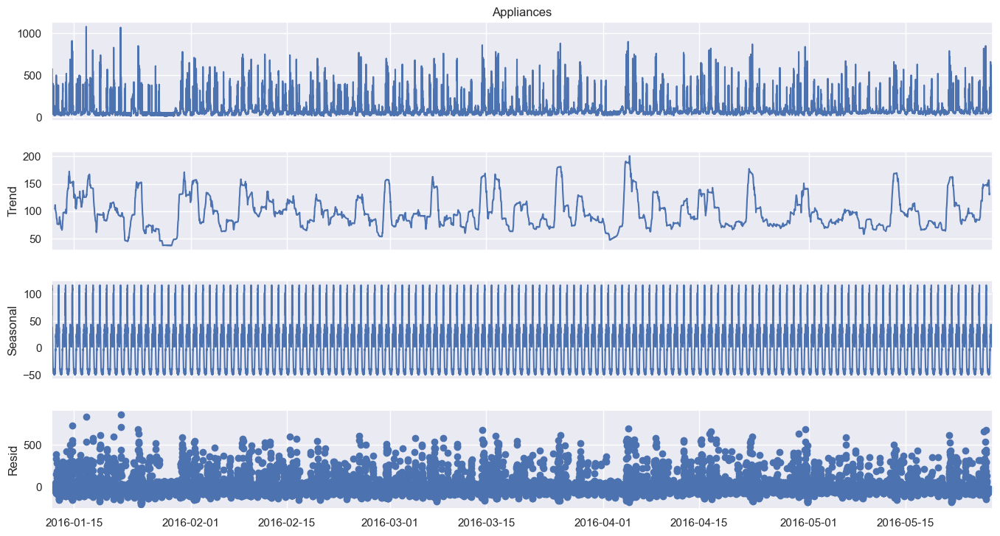

In [602]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Specify the target variable
target_variable = "Appliances"  

# Perform seasonal decomposition
result = seasonal_decompose(data[target_variable], model='additive', period=144)  

# Plot the seasonal decomposition
fig = result.plot()
fig.set_size_inches(15,8)
plt.show()

Here are some possible conclusions we can draw from this seasonal decomposition:

- Trend Component appears relatively flat, indicating no significant upward or downward trend in appliance usage over the given time period.
- Seasonal Component exhibits a clear cyclical pattern. This suggests that there is a seasonal influence on appliance usage, with regular peaks and valleys occurring at specific times within each year or season.
- Residual Component captures the random or irregular fluctuations not explained by the trend or seasonal components. The residuals appear to be relatively small, indicating that most of the variation in appliance usage can be attributed to the seasonal component.

This code below resamples the data to daily frequency by summing up the values of each column for each day. The resampled data is then used to create a pivot table for the target variable, "Appliances," with days as rows and months as columns. This pivot table is then used to generate a heatmap using seaborn, which visualizes the daily energy usage in a color-coded matrix format. The heatmap provides an easy-to-read representation of how energy usage varies across different days and months. This visualization helps us to identify patterns and trends in energy usage over time.

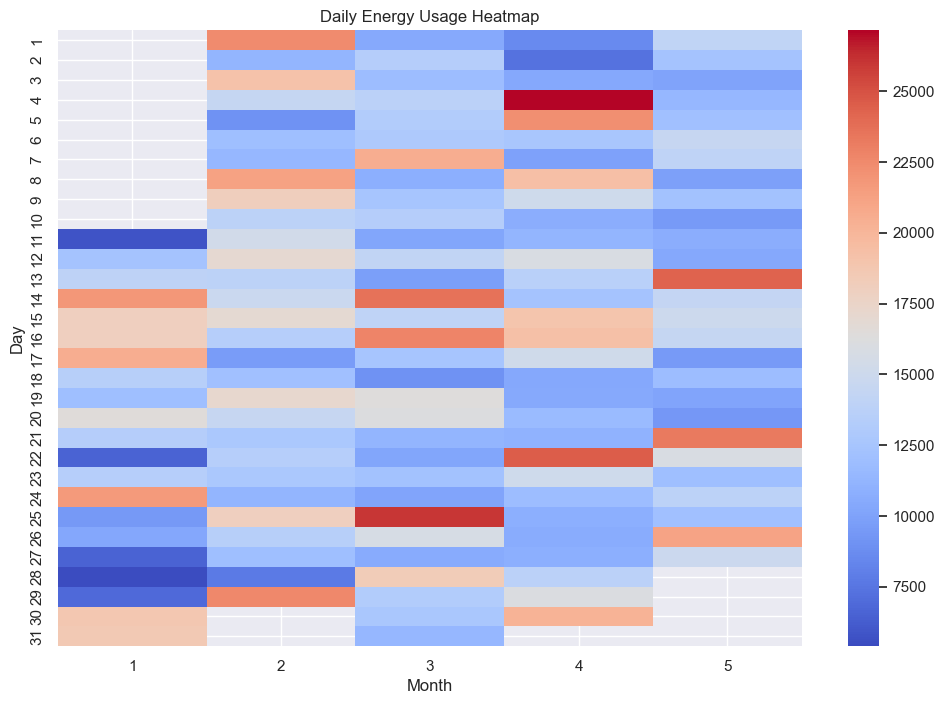

In [553]:
# Resample the data to daily frequency
daily_data = data.resample('D').sum()

# Create a pivot table to generate the heatmap
heatmap_data = daily_data.pivot_table(index=daily_data.index.day, columns=daily_data.index.month, values='Appliances')

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='coolwarm')
plt.title('Daily Energy Usage Heatmap')
plt.xlabel('Month')
plt.ylabel('Day')
plt.show()


This code creates a lag plot for the "Appliances" column in the data using a lag of 2. A lag plot is a scatter plot that visualizes the relationship between a series and a lagged version of itself. In this case, the plot shows the relationship between the energy usage of appliances at time 𝑡 and time 𝑡 + 2. The plot helps identify any autocorrelation patterns or dependencies in the time series, indicating whether there is a relationship between past and current values of the target variable. This can be useful for understanding the dynamics of the data and for building predictive models.

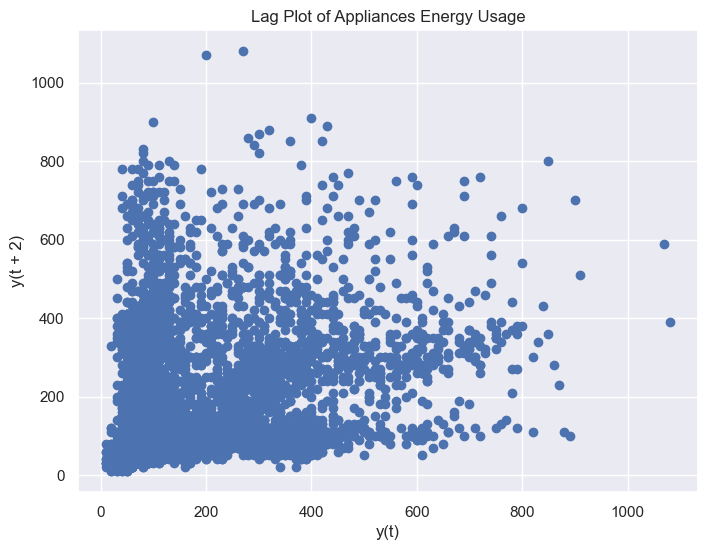

In [554]:
from pandas.plotting import lag_plot

plt.figure(figsize=(8, 6))
lag_plot(data['Appliances'],lag=2)
plt.title('Lag Plot of Appliances Energy Usage')
plt.show()

The lag scatter plot reveals a strong positive correlation between the current appliance energy usage y(t) and the previous usage y(t+2), with data points clustering along the diagonal, indicating a tendency for similar consumption levels to persist across periods. However, there are outliers representing drastic changes in usage. The non-linear relationship and recurring patterns suggest underlying dynamics or seasonality influencing energy consumption. Overall, the plot highlights the dependence of current usage on past consumption while also indicating instances of significant deviations and potential periodic patterns in the data.

This code below calculates and visualizes the moving average and rolling standard deviation of energy usage for appliances over a specified window size of 144 intervals, representing a full day of data (24 hours * 6 intervals per hour). The moving average is calculated as the average energy usage over the specified window, while the rolling standard deviation measures the variability of energy usage within the same window.

The plot shows three lines: the original data for energy usage, the moving average, and the rolling standard deviation. The moving average smooths out short-term fluctuations, revealing underlying trends, while the rolling standard deviation highlights periods of high variability or stability in energy usage. This visualization helps in understanding the trends and variations in the energy usage of appliances over time.

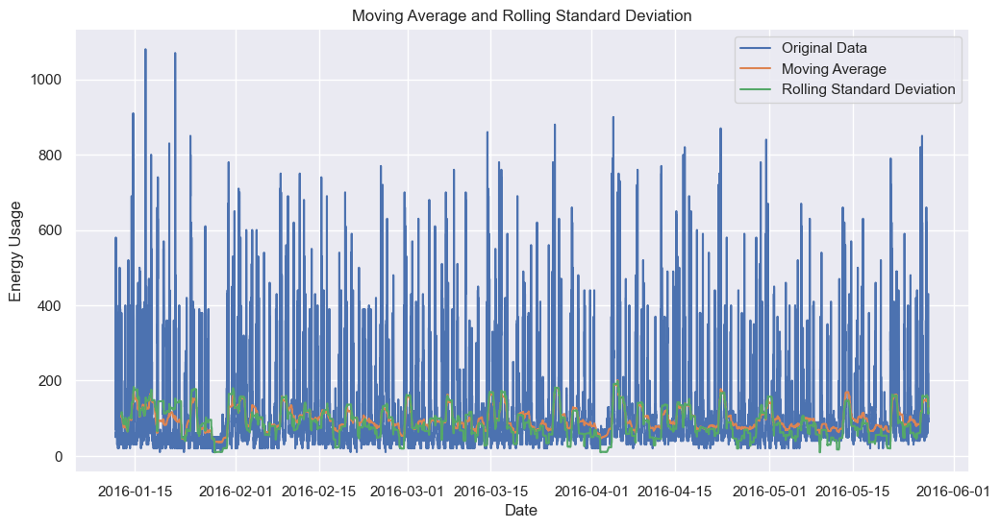

In [604]:
# Calculate moving average and rolling standard deviation
data['moving_avg'] = data['Appliances'].rolling(window=144).mean()
data['rolling_std'] = data['Appliances'].rolling(window=144).std()

# Plot moving average and rolling standard deviation
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['Appliances'], label='Original Data')
plt.plot(data.index, data['moving_avg'], label='Moving Average')
plt.plot(data.index, data['rolling_std'], label='Rolling Standard Deviation')
plt.xlabel('Date')
plt.ylabel('Energy Usage')
plt.title('Moving Average and Rolling Standard Deviation')
plt.legend()
plt.show()

In [605]:
# Removing the extra column of moving_avg and rolling_std
data = data.drop(columns=['moving_avg','rolling_std'])

This code visualizes the autocorrelation function (ACF) and partial autocorrelation function (PACF) of the target variable (energy usage of appliances) using the Statsmodels library. The plot_acf function plots the ACF, which measures the correlation between a time series and its lagged values, over a specified number of lags (40 lags in this case). The plot_pacf function plots the PACF, which measures the correlation between a time series and its lagged values while removing the influence of intermediate lags. These plots help in understanding how the target variable is correlated with its past values and can aid in identifying potential seasonal patterns, trends, or lags that are significant for modeling time series data.

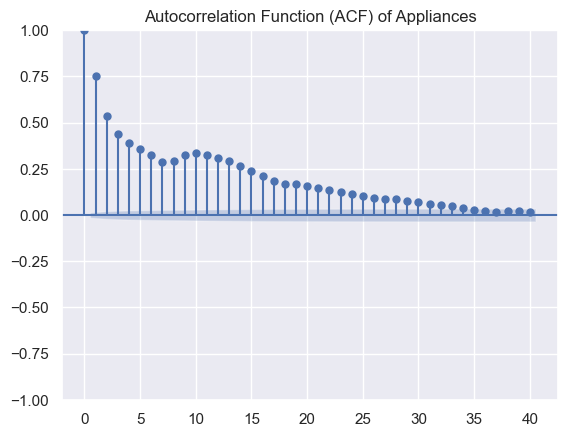

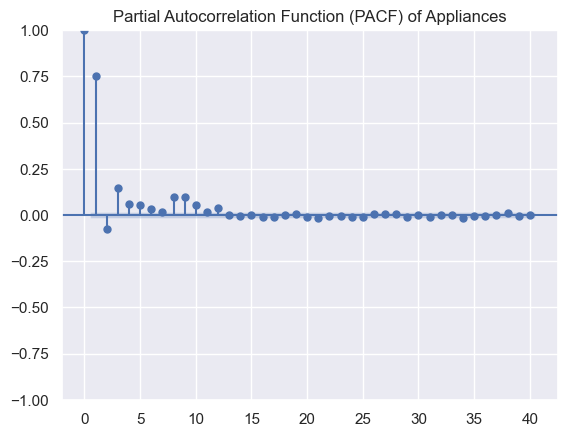

In [606]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
target = data['Appliances']
plot_acf(target, lags=40)
plt.title(f'Autocorrelation Function (ACF) of Appliances')
plt.show()
plot_pacf(target, lags=40)
plt.title(f'Partial Autocorrelation Function (PACF) of Appliances')
plt.show()

This code below is performing feature selection based on the correlation between features and the target variable (Appliances) using Pearson correlation. It also identifies the features with the highest correlation with the target variable. By examining the correlation between each feature and the target variable, the code helps us to identify which features are most relevant for predicting the target variable. This information can guide feature selection in our model-building process.

Here is how the code works - The code imports mutual_info_regression from sklearn.feature_selection to compute mutual information later in the script. The target variable is set to 'Appliances' and the features are prepared by dropping this target variable from the dataset. The code calculates the Pearson correlation matrix for the dataset to find correlations between features and the target variable, storing these in target_correlations. It prints the correlation values and sorts the absolute values of these correlations in descending order to identify the top 5 features with the highest correlation to the target variable.

Output - The output shows the correlation coefficients between the target variable Appliances and other features in the dataset. The value of Appliances is always 1 since it is perfectly correlated with itself. The top features with the highest absolute correlation to Appliances are lights (0.197), RH_out (-0.152), T2 (0.120), T6 (0.118), and T_out (0.099). This suggests that these features may have a significant relationship with the target variable and should be considered important for modeling and analysis.

In [562]:
from sklearn.feature_selection import mutual_info_regression

# Define the target variable
target_variable = 'Appliances'

# Drop the target variable from the features
features = data.drop(target_variable, axis=1)

# Calculate the correlation matrix using Pearson correlation
correlation_matrix = data.corr()

# Calculate the correlation of each feature with the target variable
target_correlations = correlation_matrix[target_variable]
print(target_correlations)

# Print the top features with the highest correlation with the target variable
print("\nTop features with the highest correlation with the target variable:")
print(target_correlations.abs().sort_values(ascending=False)[1:6])

Appliances     1.000000
lights         0.197278
T1             0.055447
RH_1           0.086031
T2             0.120073
RH_2          -0.060465
T3             0.085060
RH_3           0.036292
T4             0.040281
RH_4           0.016965
T5             0.019760
RH_5           0.006955
T6             0.117638
RH_6          -0.083178
T7             0.025801
RH_7          -0.055642
T8             0.039572
RH_8          -0.094039
T9             0.010010
RH_9          -0.051462
T_out          0.099155
Press_mm_hg   -0.034885
RH_out        -0.152282
Windspeed      0.087122
Visibility     0.000230
Tdewpoint      0.015353
rv1           -0.011145
rv2           -0.011145
Name: Appliances, dtype: float64

Top features with the highest correlation with the target variable:
lights    0.197278
RH_out    0.152282
T2        0.120073
T6        0.117638
T_out     0.099155
Name: Appliances, dtype: float64


The code below uses mutual information regression to assess the relationship between features and the target variable (Appliances) for feature selection. This code helps identify the most relevant features for predicting the target variable, based on their mutual information scores.

Here is how the code works - It uses the mutual_info_regression function from the sklearn.feature_selection module to compute mutual information scores between each feature and the target variable. The result is a list of mutual information scores. Then a pandas DataFrame (mutual_info_df) is created containing the features and their corresponding mutual information scores. The DataFrame is sorted in descending order based on mutual information scores to identify the features that have the highest mutual information with the target variable. The top features with the highest mutual information scores are printed, allowing for an overview of the most important features in terms of their relationship with the target variable. The top features based on mutual information scores are plotted using a bar plot. The x-axis represents mutual information scores, and the y-axis lists the features. The bar plot helps visualize which features have the most significant relationships with the target variable.

Output - The output shows the top features with the highest mutual information scores in relation to the target variable, which is 'Appliances.' Mutual information measures the amount of information that one feature provides about the target variable. Features with higher mutual information scores are considered to be more relevant in predicting the target variable. Feature T9, T4, T5, T8 and RH_6 shows significantly high mutual information with the target variable. 


Top features with the highest mutual information with the target variable:
   Feature  Mutual_Info
17      T9     0.123125
9       T5     0.112380
12    RH_6     0.112188
15      T8     0.108097
7       T4     0.105319


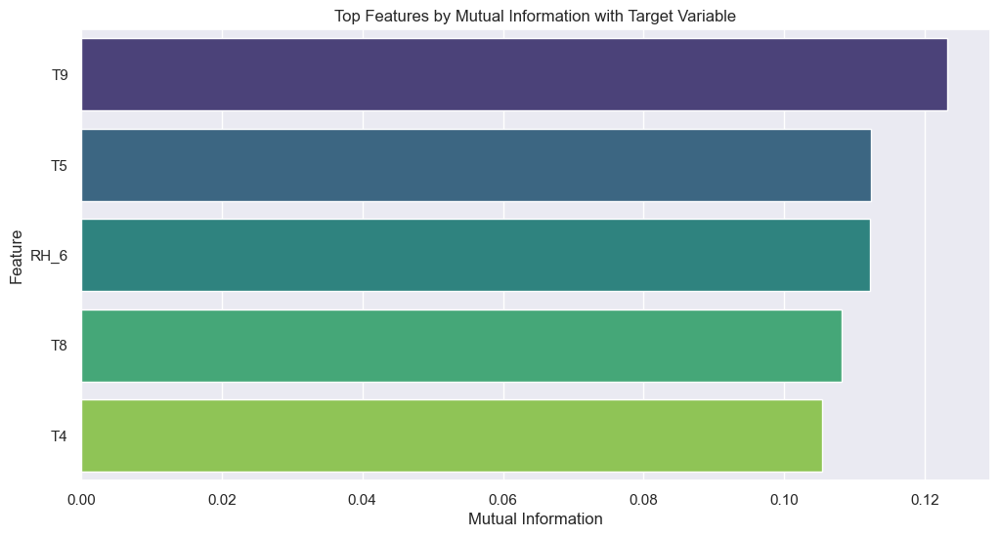

In [563]:
# Perform mutual information regression for feature selection
mutual_info_scores = mutual_info_regression(features, data[target_variable])

# Create a DataFrame with features and their corresponding mutual information scores
mutual_info_df = pd.DataFrame({
    'Feature': features.columns,
    'Mutual_Info': mutual_info_scores
})

# Sort the DataFrame based on mutual information scores
mutual_info_df.sort_values(by='Mutual_Info', ascending=False, inplace=True)

# Print the top features based on mutual information scores
print("\nTop features with the highest mutual information with the target variable:")
print(mutual_info_df.head())

# Plot the top features based on mutual information scores
plt.figure(figsize=(12, 6))
sns.barplot(x='Mutual_Info', y='Feature', data=mutual_info_df.head(), hue='Feature', palette='viridis')
plt.title("Top Features by Mutual Information with Target Variable")
plt.xlabel("Mutual Information")
plt.ylabel("Feature")
plt.show()

The features we should keep or drop in out dataset depend on how strongly they correlate with the target variable (energy use) and how much mutual information they contain. 

Based on Correlation:
- We are keeping features that show a moderate to strong correlation with the target variable. In our output, the following features have the highest correlation with the target variable (Appliances): lights (0.197), RH_out (0.152), T2 (0.120), T6 (0.118) and T_out (0.099)

Based on Mutual Information:
- We can keep features that show high mutual information with the target variable. In your output, the following features have the highest mutual information with the target variable (Appliances): T9 (0.128), T5 (0.115), RH_6 (0.110), T4 (0.107) and T1(0.106)

In [565]:
# Drop the specified columns from the data DataFrame
data.drop(['RH_1', 'RH_2', 'T3', 'RH_3', 'RH_4', 'RH_5', 'T7', 'RH_7', 'T8', 'RH_8', 'RH_9', 'Press_mm_hg', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2'], axis=1, inplace=True)


The code below downsample the 10-minute data to hourly data. The reason we are downsampling the data rather than upsampling it are stated below - 
- Downsampling from a 10-minute interval can help reduce short-term noise in the data. This can allow the model to focus more on long-term trends and patterns, improving its ability to generalize.
- By aggregating the data to a lower frequency (e.g., hourly), we can simplify the dataset and reduce its complexity. This can make the data easier to model.
- Using high-frequency data can sometimes lead to overfitting, where the model captures noise or short-term fluctuations rather than genuine trends. Downsampling the data can help avoid this issue.
- LSTM models, in particular, can be sensitive to data complexity and may benefit from working with data that has been downsampled to reduce unnecessary complexity.
- For time series models such as SARIMA and Seasonal Naive, using a lower frequency (downsampled data) can make the analysis and interpretation of the results more straightforward, especially if there is a natural pattern in the data at lower frequencies.

Here is what the code does - The .resample('h') function groups the data into hourly intervals (frequency = 'h'). Then, the .mean() function calculates the mean value of the data points within each hourly interval. The result is a new DataFrame (hourly_data) that contains the mean values of the data points for each hour. 

In [610]:
# Downsample the data to hourly frequency
hourly_data = data.resample('h').mean()

When selecting methods for time series forecasting, I chose LSTM, SARIMA, and Seasonal Naive Method to address various aspects of the data and task at hand.

- LSTM: Given the potential for complex patterns and nonlinear relationships in the data, Long Short-Term Memory (LSTM) models were chosen for their ability to capture temporal dependencies over long sequences and to handle irregularities in the data. LSTM is well-suited for time series forecasting due to its recurrent architecture, which allows it to remember and utilize information from previous time steps effectively.
- SARIMA: Seasonal AutoRegressive Integrated Moving Average (SARIMA) was selected due to its efficacy in handling seasonal patterns and its proven track record as a standard method in time series analysis. SARIMA provides a structured approach by modeling autoregressive, integrated, and moving average components, as well as seasonal variations. This method is beneficial for capturing trends and seasonality in the data.
- Seasonal Naive Method: The Seasonal Naive Method approach was chosen as a baseline method to provide a simple, interpretable benchmark against which the more sophisticated models could be compared. By leveraging seasonality in the data, it serves as a straightforward yet effective forecasting method.

### 3. Implement prediction models

The code below splits the dataset hourly_data into training and test sets. It calculates 80% of the total length of the dataset to determine the size of the training set. The training set (train_data_hourly) contains the first 80% of the data, while the test set (test_data_hourly) contains the remaining 20% of the data. This partitioning allows for training the model on earlier data and testing its performance on a separate, more recent portion of the dataset, which is crucial for assessing model generalization.

In [568]:
# Split the data into train and test sets
train_size = int(len(hourly_data) * 0.8)
train_data_hourly = hourly_data.iloc[:train_size]
test_data_hourly = hourly_data.iloc[train_size:]

The code below initializes a MinMaxScaler object to normalize the data within a specific range, typically between 0 and 1. The code applies the scaler to the training (train_data_hourly) and testing (test_data_hourly) datasets' target variable (e.g., 'Appliances'). It fits the scaler on the training data, transforming the target variable to a normalized range, and then uses the fitted scaler to transform the testing data in the same way. This normalization helps in training model and generalize it better.

The function prepare_lstm_data(data, look_back) takes the data and a look-back period (look_back), which defines how far back in time the LSTM model will look to make predictions. The function creates sequences of data (X) and corresponding labels (y) for training the model. For each point in the data, the function creates a window of length look_back that is used as an input feature (X), and the following data point as the corresponding target (y).

The LSTM model requires the data to be in a specific shape: (samples, time steps, features). After preparing the data, the function reshapes the training and testing data arrays (X_train_lstm and X_test_lstm) to fit the required format.

In [590]:
# Initialize MinMaxScaler and fit to training data
scaler = MinMaxScaler()

# Use `.loc` to specify the column and modify data in-place
train_data_hourly.loc[:, target_variable] = scaler.fit_transform(train_data_hourly.loc[:, target_variable].values.reshape(-1, 1))
test_data_hourly.loc[:, target_variable] = scaler.transform(test_data_hourly.loc[:, target_variable].values.reshape(-1, 1))

# Function to prepare data for LSTM model
def prepare_lstm_data(data, look_back):
    X, y = [], []
    for i in range(len(data) - look_back):
        X.append(data[i:i + look_back])
        y.append(data[i + look_back])
    return np.array(X), np.array(y)

look_back = 24  # Define look-back period (24 hours for daily patterns)

# Prepare data for LSTM
X_train_lstm, y_train_lsm = prepare_lstm_data(train_data_hourly.loc[:, target_variable].values, look_back)
X_test_lstm, y_test_lsm = prepare_lstm_data(test_data_hourly.loc[:, target_variable].values, look_back)

# Reshape the data for LSTM (samples, time steps, features)
X_train_lstm = X_train_lstm.reshape((X_train_lstm.shape[0], X_train_lstm.shape[1], 1))
X_test_lstm = X_test_lstm.reshape((X_test_lstm.shape[0], X_test_lstm.shape[1], 1))

The code below starts by running the Augmented Dickey-Fuller (ADF) test on the target variable 'Appliances' in the hourly training data. The test checks for stationarity in the time series by providing the ADF test statistic, p-value, and other diagnostic information about the series' properties. A lower p-value (<0.05) suggests the series is stationary, which is crucial for reliable modeling. Next, the code uses auto_arima from the pmdarima library to automatically find the optimal ARIMA model for the data. It searches through different combinations of ARIMA parameters (p, d, q) and seasonal ARIMA parameters (P, D, Q, S), aiming to minimize the chosen evaluation metric (e.g., AIC). The process outputs a summary of the best-fitting model, which can be used for further time series analysis and forecasting.

In [570]:
from statsmodels.tsa.stattools import adfuller
def ad_test(df):
    dftest = adfuller(df,autolag = 'AIC')
    print("1. ADF : ",dftest[0])
    print("2. P-value : ",dftest[1])
    print("3. Num of Lags : ",dftest[2])
    print("4. Num of observations used for ADF Regression and Critical Values Calculation : ",dftest[3])
    print("5. Critical Values : ")
    for key,val in dftest[4].items():
        print("\t",key,":",val)
ad_test(train_data_hourly['Appliances'])
stepwise_fit = auto_arima(train_data_hourly['Appliances'],trace=True,suppress_warnings=True)
stepwise_fit.summary()

1. ADF :  -8.533333924086952
2. P-value :  1.0236016234057551e-13
3. Num of Lags :  28
4. Num of observations used for ADF Regression and Critical Values Calculation :  2603
5. Critical Values : 
	 1% : -3.432864698592546
	 5% : -2.8626509998056635
	 10% : -2.567361424947927
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-3885.523, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-2727.235, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-3778.030, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-3372.429, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1336.389, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-3886.419, Time=0.65 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=-3696.233, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-3855.169, Time=0.27 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=-3885.457, Time=1.28 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=-3826.175, Time=0.48 sec
 ARIMA(2,0,

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2632
Model:               SARIMAX(1, 0, 2)   Log Likelihood                1948.209
Date:                Sun, 05 May 2024   AIC                          -3886.419
Time:                        20:11:40   BIC                          -3857.041
Sample:                    01-11-2016   HQIC                         -3875.781
                         - 04-30-2016                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0426      0.006      7.374      0.000       0.031       0.054
ar.L1          0.6463      0.025     25.661      0.000       0.597       0.696
ma.L1         -0.1803      0.027     -6.707      0.000      -0.233      -0.128
ma.L2          0.1456      0.018      8.272      0.000       0.111       0.180
sigma2         0.0133      0.000     53.090      0.000       0.013       0.014
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):             10904.04
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               0.70   Skew:                             2.38
Prob(H) (two-sided):                  0.00   Kurtosis:                        11.76
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The optimal model found through the stepwise search above is a model with parameters (1, 0, 2). The AIC of the best model is -3886.419, suggesting it provides a good fit to the data.

The code defines and trains an LSTM (Long Short-Term Memory) model for time series forecasting. It uses a specified look-back period to create the model, which consists of an input layer matching the look-back period, an LSTM layer with 50 units, and a dense output layer for predictions. The model is compiled with the Adam optimizer and mean squared error (MSE) loss function. Early stopping is set up using a Keras callback that monitors the validation loss during training and stops training if the loss does not improve for 3 consecutive epochs, helping to prevent overfitting and save training time. The model is then trained on the training data (X_train_lstm, y_train_lstm) for up to 50 epochs with a batch size of 32, using 10% of the data for validation (validation_split=0.1). This process builds a time series forecasting model while aiming to improve its generalization and prevent overfitting.

In [591]:
from tensorflow.keras.callbacks import EarlyStopping

# Create LSTM model function
def create_lstm_model(look_back):
    model = Sequential([
        Input(shape=(look_back, 1)),  # Explicit Input layer specifying the look-back window size
        LSTM(50, return_sequences=False),  # LSTM layer with 50 units
        Dense(1)  # Dense output layer
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Create and compile LSTM model
model = create_lstm_model(look_back)

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

# Train LSTM model with early stopping
model.fit(X_train_lstm, y_train_lstm, epochs=50, batch_size=32, verbose=1, validation_split=0.1, callbacks=[early_stopping])


Epoch 1/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0225 - val_loss: 0.0126
Epoch 2/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0188 - val_loss: 0.0114
Epoch 3/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0138 - val_loss: 0.0114
Epoch 4/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0161 - val_loss: 0.0108
Epoch 5/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0128 - val_loss: 0.0108
Epoch 6/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0153 - val_loss: 0.0105
Epoch 7/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0122 - val_loss: 0.0103
Epoch 8/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0130 - val_loss: 0.0104
Epoch 9/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0128 - val_loss: 0.0101
Epoch 10/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0126 - val_loss: 0.0103
Epoch 11/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0131 - val_loss: 0.0099
Epoch 12/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0140 - val_lo

The function seasonal_naive_forecast below implements a seasonal naïve forecasting method for time series data. The function shifts the data by the specified period to create the forecast. This means each value in the forecasted series is taken from the data at the same time step one full season earlier. 

In essence, the function uses the historical values from the previous seasonal cycle as the forecast for the current cycle. This is a straightforward approach and works well when the time series exhibits strong and consistent seasonal patterns.

In [611]:
def seasonal_naive_forecast(data, period):
    
    # Shift the data by the period to create the forecast
    forecast = data.shift(period)
    return forecast

### 4. Train prediction models

The function train_lstm_model is designed to train an LSTM (Long Short-Term Memory) model using provided training data (X_train and y_train) over a specified number of epochs and with a specified batch size. The function calls the fit method of the provided model to adjust its parameters based on the input data. This allows the model to learn patterns in the training data and improve its ability to make accurate predictions. The training process continues for the number of iterations (epochs) specified, with the data being processed in groups of a certain size (batch size). The function returns the trained model, which can be used for making predictions on new, unseen data. This process is essential for optimizing the model's performance and ensuring it generalizes well to new data.

In [609]:
def train_lstm_model(model, X_train, y_train, epochs=50, batch_size=1):
    
    # Train the model
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=2)
    return model  # Return the trained model


The function train_seasonal_naive performs a seasonal naïve forecasting approach on the provided data for a specified target variable and period. It uses the helper function seasonal_naive_forecast to create the forecast by shifting the data by the specified period. This approach assumes that the future values of the target variable will follow the same patterns as seen in the past at the specified seasonal period. The function returns the forecasted values, which can be used to make predictions based on the observed historical data. This method is particularly useful for data with clear and consistent seasonal patterns.

In [612]:
def train_seasonal_naive(data, target_variable, period):
    
    # Perform seasonal naïve forecasting
    forecast = seasonal_naive_forecast(data[target_variable], period)
    return forecast

The train_sarima function is used to train a SARIMA (Seasonal AutoRegressive Integrated Moving Average) model on the specified data. The function takes a DataFrame data, a target column, and the model order and seasonal_order as inputs. It initializes the SARIMAX model with the given order and seasonal order, specifying the target column from the data. The function also sets parameters to not enforce stationarity and invertibility. The model is then fit using optimization parameters such as a maximum iteration limit (maxiter=1000) and a specific optimization method (method='bfgs') with a tolerance level (gtol=1e-4). The trained model (model_fit) is returned, which can be used for forecasting and further analysis.

In [575]:
# Function to train SARIMA model
def train_sarima(data, column, order, seasonal_order):
    
    # Train the SARIMA model
    model = SARIMAX(data[column], order=order, seasonal_order=seasonal_order,
                   enforce_stationarity=False, enforce_invertibility=False)
    # Fit the model with adjusted optimization parameters
    model_fit = model.fit(maxiter=1000, method='bfgs', gtol=1e-4)
    return model_fit

### 5. Test predictin models and show results

The test_and_evaluate_lstm function evaluates the performance of a trained LSTM model using test data and calculates error metrics. The function takes the trained LSTM model, a scaler for inverse transforming predictions and true values, X_test and y_test data, and test_data, along with the target_variable, look_back period, and a title describing the data. The model uses X_test data to predict the target variable, which is then inverse transformed back to its original scale using the provided scaler. The function calculates mean absolute error (MAE) and root mean squared error (RMSE) between the true values (y_test) and predictions, and prints these error metrics. Finally, the function plots the true values and predictions on a graph to visually compare them, providing insight into the model's predictive performance on the test data.

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Downsampled Data (Hourly):
Mean Absolute Error (MAE): 0.051215679211193986
Root Mean Squared Error (RMSE): 0.09083740521870806


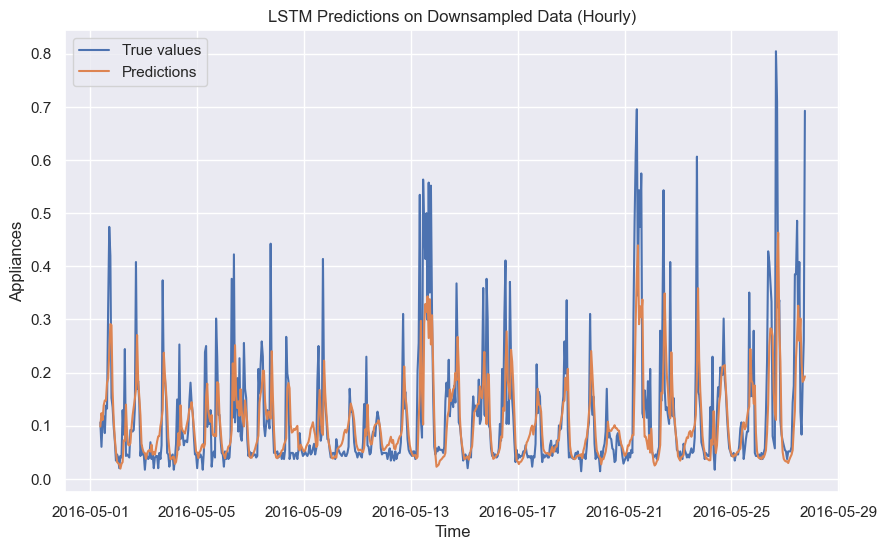

In [592]:
# Function to evaluate LSTM model
def test_and_evaluate_lstm(model, scaler, X_test, y_test, test_data, target_variable, look_back, title):
    # Predict the data using the model
    predictions = model.predict(X_test)
    
    # Inverse transform predictions and true values
    predictions = scaler.inverse_transform(predictions)
    y_test = scaler.inverse_transform(y_test.reshape(-1, 1))
    
    # Calculate MAE and RMSE
    mae = mean_absolute_error(y_test, predictions)
    rmse = math.sqrt(mean_squared_error(y_test, predictions))
    
    # Print MAE and RMSE
    print(f"{title}:")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    
    # Plot true values and predictions
    plt.figure(figsize=(10, 6))
    plt.plot(test_data.index[look_back:], y_test, label='True values')
    plt.plot(test_data.index[look_back:], predictions, label='Predictions')
    plt.title(f'LSTM Predictions on {title}')
    plt.xlabel('Time')
    plt.ylabel(target_variable)
    plt.legend()
    plt.show()

# Evaluate the model
test_and_evaluate_lstm(model, scaler, X_test_lstm, y_test_lstm, test_data_hourly, target_variable, look_back, 'Downsampled Data (Hourly)')


The test_and_evaluate_naive_forecast function below evaluates the performance of a seasonal naive forecast for a target variable. It calculates mean absolute error (MAE) and root mean squared error (RMSE) between the actual values and the forecasted values from the seasonal naive method, using the given period of seasonality. The function prints the performance metrics and visualizes the actual data against the forecasted data, providing insight into how well the seasonal naive forecast performs. It uses the actual and forecasted data starting from the specified period to ensure a proper comparison. The function plots the data, displaying the actual values and forecasted values, allowing for a visual assessment of forecast accuracy and trends over time.

In [617]:
def test_and_evaluate_naive_forecast(actual, forecast, data, target_variable, period, title):

    # Calculate MAE and RMSE
    mae = mean_absolute_error(actual[period:], forecast[period:])
    rmse = math.sqrt(mean_squared_error(actual[period:], forecast[period:]))
    
    # Print the performance metrics
    print(f"{title}:")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    
    # Plot actual vs. forecasted data
    plt.figure(figsize=(12, 6))
    plt.plot(data[target_variable], label='Actual')
    plt.plot(forecast, label='Seasonal Naïve Forecast', linestyle='--', color='orange')
    plt.title(f'Actual vs. Seasonal Naïve Forecast for {target_variable} - {title}')
    plt.xlabel('Date')
    plt.ylabel(target_variable)
    plt.legend()
    plt.show()

The code below generates and evaluates forecasts using the seasonal naive method for downsampled data (hourly frequency) with daily seasonality (24-hour period). The train_seasonal_naive function creates forecasts by shifting the target variable by the defined period. Then, the function test_and_evaluate_naive_forecast calculates performance metrics (mean absolute error and root mean squared error) to assess forecast accuracy compared to actual values. Additionally, it visualizes the actual and forecasted data for a visual comparison of forecast performance over time.

Downsampled Data (Hourly):
Mean Absolute Error (MAE): 52.897530108185336
Root Mean Squared Error (RMSE): 95.49726967837185


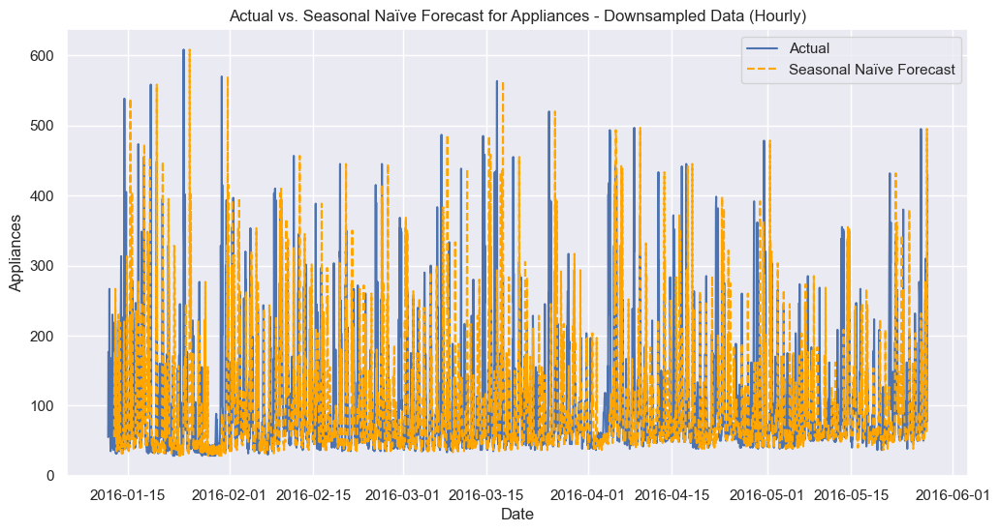

In [618]:
# Define the seasonality periods
period_hourly = 24  # 24 hours for daily seasonality in hourly data

# Generate forecasts using seasonal naïve method for downsampled data
forecast_hourly = train_seasonal_naive(hourly_data, target_variable, period_hourly)

# Test and evaluate the forecasts for downsampled data
test_and_evaluate_naive_forecast(hourly_data[target_variable], forecast_hourly, hourly_data, target_variable, period_hourly, "Downsampled Data (Hourly)")

The function test_sarima evaluates a trained SARIMA model by generating forecasts for the test data and calculating error metrics to assess the model's performance. The function takes the trained model (model_fit), the test data (test_data), and the target column (column) as inputs. It uses the trained model to forecast the future values over the length of the test data. The function then calculates mean absolute error (MAE) and root mean squared error (RMSE) between the actual test data values and the model's predictions. These metrics quantify the forecast accuracy, providing insight into how well the model performed. The function returns the predictions along with the calculated error metrics (MAE and RMSE).

In [579]:
# Function to test SARIMA model and calculate error metrics
def test_sarima(model_fit, test_data, column):
    # Make predictions
    predictions = model_fit.forecast(steps=len(test_data))

    # Calculate error metrics
    mae = mean_absolute_error(test_data[column], predictions)
    rmse = np.sqrt(mean_squared_error(test_data[column], predictions))

    return predictions, mae, rmse

The function display_results is designed to visualize and summarize the performance of a trained SARIMA model. It takes in test data, target variable, model predictions, error metrics (MAE and RMSE), and the SARIMA model's parameters (order and seasonal order). The function first prints the model's configuration (order and seasonal order) along with the calculated error metrics (MAE and RMSE). Then, it plots a graph showing the actual test data values and the model's predictions over time. This visualization helps in understanding how well the model's predictions match the actual data.

In [580]:
# Function to display results (predicted vs. actual values and evaluation metrics)
def display_results(test_data, column, predictions, mae, rmse, order, seasonal_order):
    # Print error metrics
    print(f"SARIMA {order}x{seasonal_order} on data frequency '{test_data.index.freq}':")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")

    # Plot actual vs. predicted data
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index, test_data[column], label='Actual')
    plt.plot(test_data.index, predictions, label='Predicted', color='orange')
    plt.title(f'SARIMA {order}x{seasonal_order} Predictions on {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend()
    plt.show()

This code implements a SARIMA model on hourly data to forecast the 'Appliances' target variable. It begins by defining the model's parameters, both for the non-seasonal and seasonal components (order and seasonal order). It then trains the SARIMA model using training data and the specified parameters. Once the model is trained, it tests the model's performance by generating predictions on test data and calculating error metrics such as mean absolute error (MAE) and root mean squared error (RMSE). Finally, it displays the results, including the model's error metrics and a plot of actual versus predicted values for the 'Appliances' variable in the test data.

Optimization terminated successfully.
         Current function value: -0.781140
         Iterations: 19
         Function evaluations: 27
         Gradient evaluations: 27
SARIMA (1, 0, 2)x(1, 0, 2, 24) on data frequency '<Hour>':
Mean Absolute Error (MAE): 0.05939707757059753
Root Mean Squared Error (RMSE): 0.10623536784019667


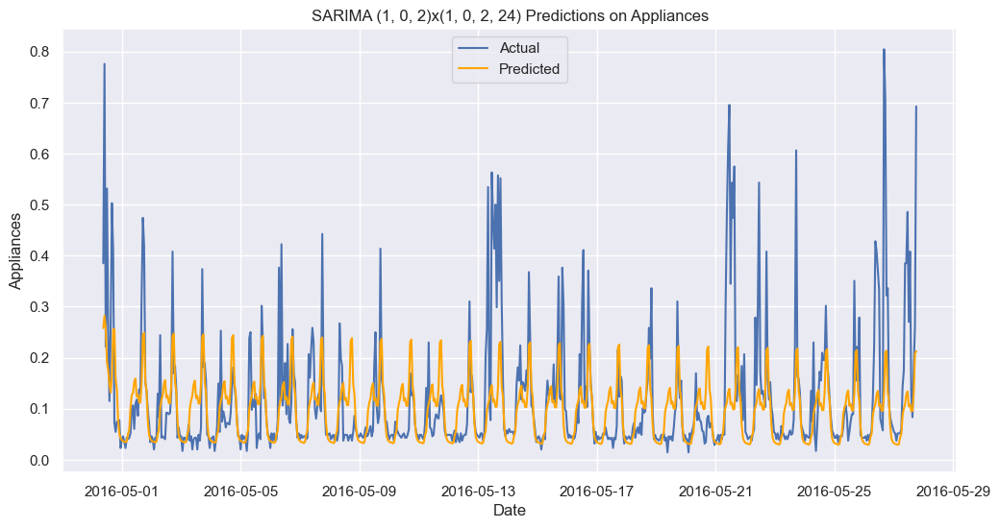

In [615]:
# Define the order of the SARIMA model (p, d, q) and seasonal parameters
order_hourly = (1, 0, 2)  
seasonal_order_hourly = (1, 0, 2, 24)  # Seasonal parameters (P, D, Q, S)

# Train the SARIMA model on hourly data
model_fit = train_sarima(train_data_hourly, 'Appliances', order_hourly, seasonal_order_hourly)

# Test the SARIMA model and calculate error metrics
predictions, mae, rmse = test_sarima(model_fit, test_data_hourly, 'Appliances')

# Display results (actual vs. predicted data and error metrics)
display_results(test_data_hourly, 'Appliances', predictions, mae, rmse, order_hourly, seasonal_order_hourly)

### 6. Compare the results from all candidate models, choose the best model, justify your choice and discuss the results

Compare the results from all candidate models, choose the best model, justify your choice and discuss the results.

Comparing the evaluation metrics of the three models (LSTM, Seasonal Naive Method, and SARIMA) on downsampled hourly data, we find notable differences in performance.

- The LSTM model has the lowest mean absolute error (MAE) of 0.0512 and the lowest root mean squared error (RMSE) of 0.0908. This indicates that LSTM is the most accurate model in terms of both absolute and squared error.

- The SARIMA model has a slightly higher MAE of 0.0594 and RMSE of 0.1062 compared to LSTM. While the performance of SARIMA is close to LSTM, it is still slightly less accurate.

- The Seasonal Naive Method model, however, performs significantly worse than the other two models, with an MAE of 52.8975 and RMSE of 95.4973. These high error metrics suggest that the Seasonal Naive Method model does not effectively capture the patterns in the data.

Based on these comparisons, the LSTM model is the best-performing model as it demonstrates the lowest errors, indicating higher accuracy in predicting the 'Appliances' variable. The LSTM model's ability to learn complex patterns and dependencies in sequential data makes it the preferred choice for final predictions.

### 7. Reflect on what you have learned by completing this assignment

Through the completion of this assignment, I have gained valuable insights into the nuances of time series forecasting and the application of various models for predictive analysis. Working with different models, including LSTM, SARIMA, and Seasonal Naive Method, allowed me to appreciate the strengths and limitations of each approach.

The process began with data preprocessing, including downsampling and splitting the dataset into training and test sets. Understanding the importance of data scaling, look-back periods, and reshaping data for LSTM enhanced my grasp of time series data preparation for machine learning models.

Implementing and evaluating LSTM models broadened my knowledge of neural networks and their application in forecasting. I learned how to use callbacks like early stopping to prevent overfitting and improve model performance. Additionally, the evaluation and interpretation of metrics such as mean absolute error (MAE) and root mean squared error (RMSE) were essential in comparing model performance.

While SARIMA and Seasonal Naive Method offered valuable benchmark comparisons, the superior performance of the LSTM model underscored the potential of deep learning for capturing complex patterns in time series data. This assignment reinforced the importance of a systematic approach to model selection and evaluation to achieve accurate and reliable forecasts. Overall, I gained a deeper appreciation for the challenges and rewards of working with time series data and predictive modeling.

### 8. References

- "https://www.simplilearn.com/tutorials/artificial-intelligence-tutorial/lstm"
- "https://www.geeksforgeeks.org/deep-learning-introduction-to-long-short-term-memory/"
- https://www.tableau.com/learn/articles/time-series-analysis
- "https://www.pmorgan.com.au/tutorials/seasonal-naive-forecasting/"
- "https://openforecast.org/adam/simpleForecastingMethods.html"
- "https://machinelearningmastery.com/sarima-for-time-series-forecasting-in-python/"
- "https://towardsdatascience.com/time-series-forecasting-with-arima-sarima-and-sarimax-ee61099e78f6"